In [27]:
import random 
random.seed(11267071)
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, classification_report, plot_confusion_matrix, confusion_matrix
import seaborn as sns
import prince
from sklearn.decomposition import PCA
from scipy import stats
from sklearn.neural_network import MLPClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.multiclass import OneVsOneClassifier
import prince
from sklearn.mixture import GaussianMixture as GM
pd.set_option("display.max_columns", None)
matplotlib.rcParams['figure.figsize'] = (15,10)

import warnings
warnings.filterwarnings('ignore')

## Edit Data Frame

In [2]:
df = pd.read_csv('musicData.csv')
df = df.drop(df[df.key.isna()].index)
df['mode'] = df['mode'].replace('Minor', 0).replace('Major',1)
df.columns = df.columns.str.replace('mode', 'isMajor')
df.tempo = df.tempo.replace('?', np.nan).astype(float)
df.duration_ms = df.duration_ms.replace(-1, np.nan)
df = pd.get_dummies(df.key, prefix='key').join(df)


# assign numerical to genre
genres = df.music_genre.unique()
for ii,z in enumerate(df.music_genre.unique()):
    df.music_genre = df.music_genre.replace(z,ii )


# cut off irrelevant features:
# only run this once!
df = df.select_dtypes([int, float, 'uint8']).drop('instance_id', axis = 1)

In [609]:
df

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,isMajor,speechiness,tempo,valence,music_genre
0,0,1,0,0,0,0,0,0,0,0,0,0,27.0,0.00468,0.652,NaN,0.941,0.79200,0.115,-5.201,0,0.0748,100.889,0.759,0
1,0,0,0,0,0,1,0,0,0,0,0,0,31.0,0.01270,0.622,218293.0,0.890,0.95000,0.124,-7.043,0,0.0300,115.002,0.531,0
2,0,0,0,0,0,0,0,0,0,0,0,1,28.0,0.00306,0.620,215613.0,0.755,0.01180,0.534,-4.617,1,0.0345,127.994,0.333,0
3,0,0,0,0,1,0,0,0,0,0,0,0,34.0,0.02540,0.774,166875.0,0.700,0.00253,0.157,-4.498,1,0.2390,128.014,0.270,0
4,0,0,0,0,0,0,0,0,0,1,0,0,32.0,0.00465,0.638,222369.0,0.587,0.90900,0.157,-6.266,1,0.0413,145.036,0.323,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50000,0,0,0,0,1,0,0,0,0,0,0,0,59.0,0.03340,0.913,NaN,0.574,0.00000,0.119,-7.022,1,0.2980,98.028,0.330,9
50001,0,0,1,0,0,0,0,0,0,0,0,0,72.0,0.15700,0.709,251860.0,0.362,0.00000,0.109,-9.814,1,0.0550,122.043,0.113,9
50002,0,0,0,0,0,1,0,0,0,0,0,0,51.0,0.00597,0.693,189483.0,0.763,0.00000,0.143,-5.443,1,0.1460,131.079,0.395,9
50003,0,0,0,0,0,0,0,0,0,0,1,0,65.0,0.08310,0.782,262773.0,0.472,0.00000,0.106,-5.016,0,0.0441,75.886,0.354,9


# Some EDA

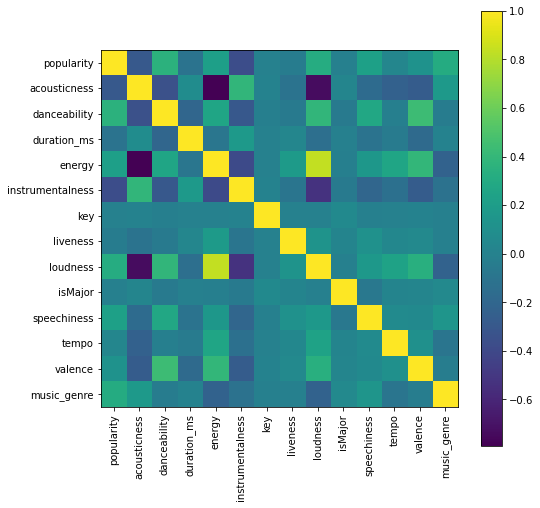

In [11]:
plt.figure(figsize = (8,8))
plt.imshow(df.corr())
plt.xticks(list(range(len(df.columns))), df.columns, rotation = 90)
plt.yticks(list(range(len(df.columns))), df.columns)
plt.colorbar()

In [61]:
df.corr()
# loudness

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,isMajor,speechiness,tempo,valence,music_genre
popularity,1.000000,-0.290453,0.356420,-0.109264,0.216345,-0.364960,-0.005212,-0.039468,0.317941,-0.013427,0.224309,0.032843,0.124913,0.313268
acousticness,-0.290453,1.000000,-0.347681,0.081902,-0.791250,0.387970,0.005796,-0.109220,-0.730401,0.025161,-0.163377,-0.232658,-0.270238,0.175039
danceability,0.356420,-0.347681,1.000000,-0.199232,0.263934,-0.301277,-0.017777,-0.051465,0.390859,-0.049634,0.279767,-0.015223,0.434557,-0.040111
duration_ms,-0.109264,0.081902,-0.199232,1.000000,-0.090450,0.167832,-0.002807,0.027964,-0.134575,-0.012244,-0.107442,-0.046663,-0.173466,0.003154
energy,0.216345,-0.791250,0.263934,-0.090450,1.000000,-0.389730,-0.001546,0.186731,0.838399,-0.017878,0.158180,0.261866,0.396317,-0.229721
instrumentalness,-0.364960,0.387970,-0.301277,0.167832,-0.389730,1.000000,0.000263,-0.093537,-0.529030,-0.060924,-0.199137,-0.126628,-0.272780,-0.116173
key,-0.005212,0.005796,-0.017777,-0.002807,-0.001546,0.000263,1.000000,-0.001112,-0.003095,0.057697,-0.012535,-0.005573,-0.000466,-0.009499
liveness,-0.039468,-0.109220,-0.051465,0.027964,0.186731,-0.093537,-0.001112,1.000000,0.126504,0.013550,0.114475,0.039681,0.052110,-0.012630
loudness,0.317941,-0.730401,0.390859,-0.134575,0.838399,-0.529030,-0.003095,0.126504,1.000000,-0.008744,0.165578,0.239361,0.340664,-0.228094
isMajor,-0.013427,0.025161,-0.049634,-0.012244,-0.017878,-0.060924,0.057697,0.013550,-0.008744,1.000000,-0.077379,0.019638,0.025427,0.052236


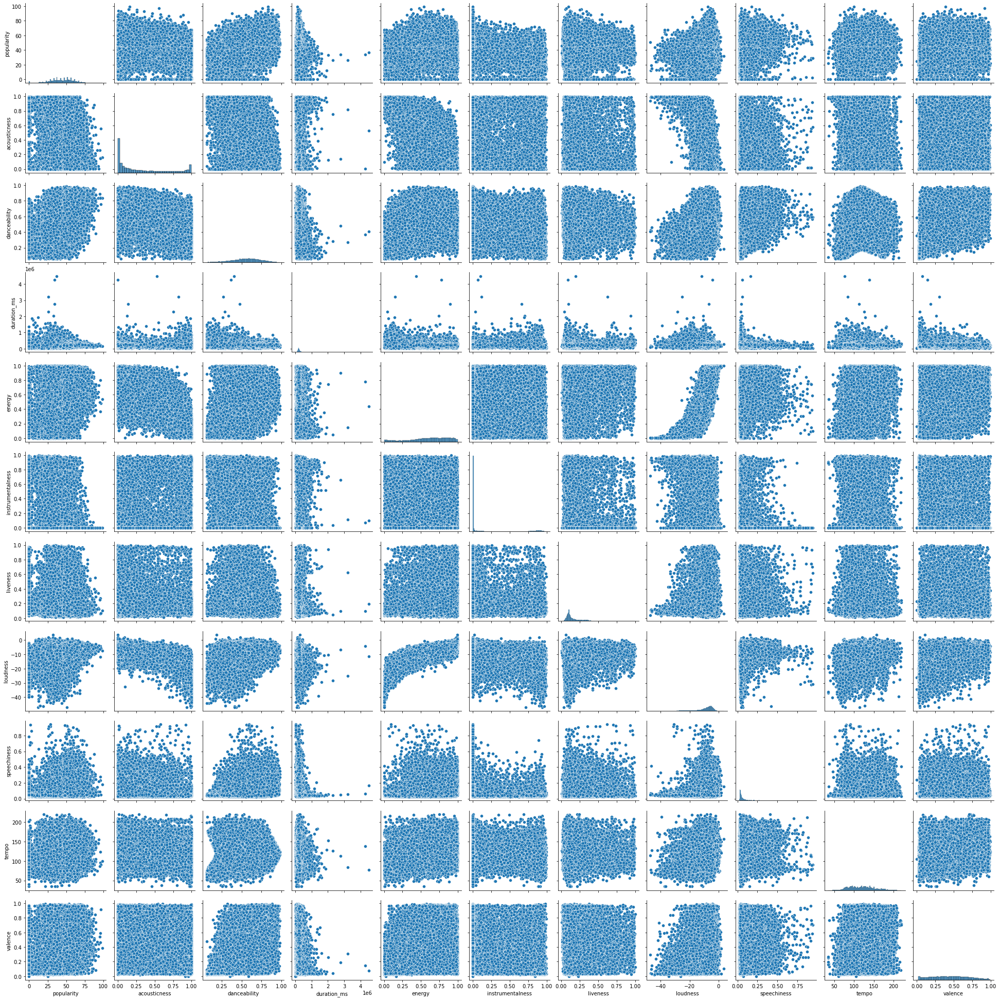

In [62]:
sns.pairplot(X.select_dtypes(float))

In [ ]:
for ii in df.columns:
    sns.displot(df[ii]);

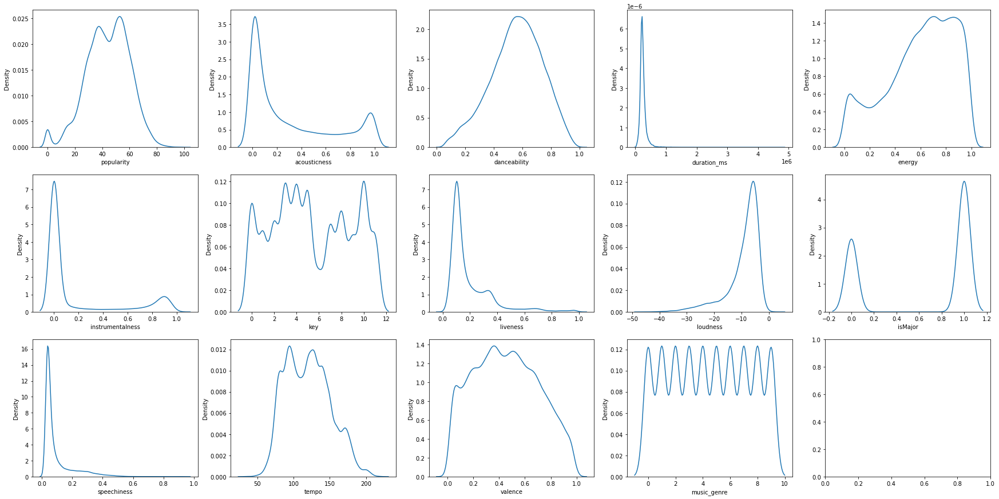

In [510]:
def plotDist():
    fig, ax = plt.subplots(3,5,figsize = (30,15))
    z= 0
    for kk in range(3):
        for jj in range(5):
            try:
                sns.distplot(df[df.columns[z]], ax = ax[kk, jj], hist = False, label = ii);
            except:
                pass
            z += 1
plotDist()

In [511]:
df.isna().sum()

popularity             0
acousticness           0
danceability           0
duration_ms         4939
energy                 0
instrumentalness       0
key                    0
liveness               0
loudness               0
isMajor                0
speechiness            0
tempo               4980
valence                0
music_genre            0
dtype: int64

In [3]:
# Fill nan with median of that genre
for ii in df.music_genre.unique():
    df.loc[df[df.duration_ms.isna() & (df.music_genre == ii)].index, 'duration_ms'] = df[df.duration_ms.isna() & (df.music_genre == ii)]['duration_ms'].fillna(df.groupby('music_genre').get_group(ii).median()['duration_ms'])

for ii in df.music_genre.unique():
    df.loc[df[df.tempo.isna() & (df.music_genre == ii)].index, 'tempo'] = df[df.tempo.isna() & (df.music_genre == ii)]['tempo'].fillna(df.groupby('music_genre').get_group(ii).median()['tempo'])

In [4]:
# distribution of all features
df1 = df.copy()

In [5]:
# Need to transform some variables
def transform():
    df['duration_ms'] = np.log(df1.duration_ms)
    df['speechiness'] = np.log(df1['speechiness'])
    df.acousticness = np.sqrt(df1.acousticness)
    #sns.distplot(np.sqrt(df.acousticness), hist = False, label = ii);
    df.liveness = np.log(df1.liveness)
    df.instrumentalness = np.cbrt(df1.instrumentalness)
    df.loudness = np.cbrt(df1.loudness)


transform()
#plotDist()
#sns.distplot(np.cbrt(df1.loudness) , hist = False, label = ii);
#np.sqrt(df1.loudness).describe()
#sns.distplot(np.cbrt(df1.loudness) , hist = False, label = ii);


## how do the features distribute across genres?

In [ ]:
#sns.boxplot(x = [df.groupby('music_genre').get_group(x) for x in df.music_genre.unique()])
for ii in df.columns:
    plt.figure()
    plt.boxplot(x =[df.groupby('music_genre').get_group(x).dropna()[ii] for x in df.music_genre.unique()], showmeans=True);
    plt.title(ii)

In [396]:
df.loudness.describe()

count    50000.000000
mean        -2.003761
std          0.419606
min         -3.610003
25%         -2.214505
50%         -1.937794
75%         -1.729474
max          1.552787
Name: loudness, dtype: float64

In [491]:
df

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,isMajor,speechiness,tempo,valence,music_genre
0,0,1,0,0,0,0,0,0,0,0,0,0,27.0,0.068411,0.652,12.409899,0.941,0.925213,-2.162823,-1.732589,0,-2.592937,100.889,0.759,0
1,0,0,0,0,0,1,0,0,0,0,0,0,31.0,0.112694,0.622,12.293593,0.890,0.983048,-2.087474,-1.916840,0,-3.506558,115.002,0.531,0
2,0,0,0,0,0,0,0,0,0,0,0,1,28.0,0.055317,0.620,12.281240,0.755,0.227664,-0.627359,-1.665150,1,-3.366796,127.994,0.333,0
3,0,0,0,0,1,0,0,0,0,0,0,0,34.0,0.159374,0.774,12.025000,0.700,0.136262,-1.851509,-1.650719,1,-1.431292,128.014,0.270,0
4,0,0,0,0,0,0,0,0,0,1,0,0,32.0,0.068191,0.638,12.312093,0.587,0.968697,-1.851509,-1.843586,1,-3.186893,145.036,0.323,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50000,0,0,0,0,1,0,0,0,0,0,0,0,59.0,0.182757,0.913,12.279509,0.574,0.000000,-2.128632,-1.914933,1,-1.210662,98.028,0.330,9
50001,0,0,1,0,0,0,0,0,0,0,0,0,72.0,0.396232,0.709,12.436629,0.362,0.000000,-2.216407,-2.140994,1,-2.900422,122.043,0.113,9
50002,0,0,0,0,0,1,0,0,0,0,0,0,51.0,0.077266,0.693,12.152055,0.763,0.000000,-1.944911,-1.759055,1,-1.924149,131.079,0.395,9
50003,0,0,0,0,0,0,0,0,0,0,1,0,65.0,0.288271,0.782,12.479046,0.472,0.000000,-2.244316,-1.711798,0,-3.121295,75.886,0.354,9


'        \nfor jj in df.columns:\n    plt.figure()\n    for ii in range(0, 10):\n        sns.distplot(df[df.music_genre == ii][jj], hist = False, label = ii);\n    plt.legend(range(0, 10))'

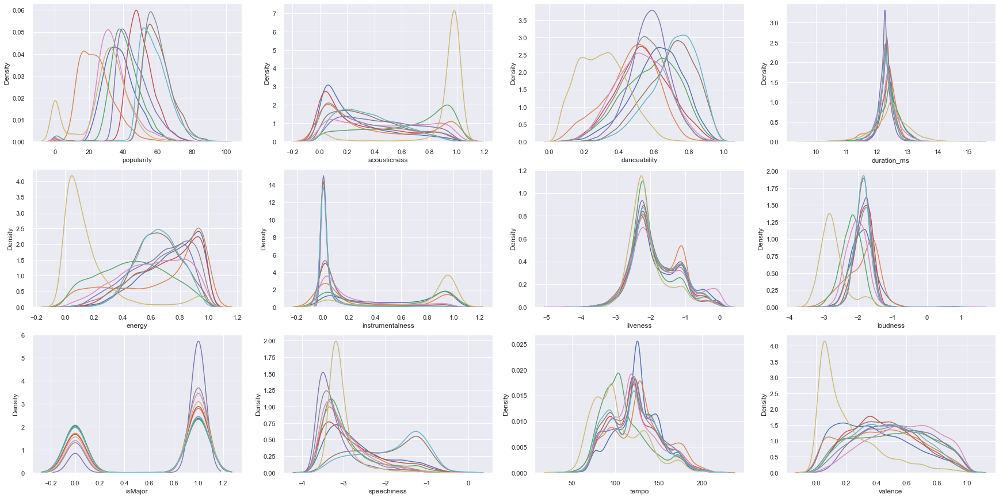

In [512]:
temp = df.iloc[:, 12:]

fig, ax = plt.subplots(3,4,figsize = (30,15))
#sns.set(font_scale = 1)
z= 0
for kk in range(3):
    for jj in range(4):

        for ii in range(0, 10):
                
                sns.distplot(temp[temp.music_genre == ii][temp.columns[z]], ax = ax[kk, jj], hist = False, label = ii);


            

        z += 1

'''        
for jj in df.columns:
    plt.figure()
    for ii in range(0, 10):
        sns.distplot(df[df.music_genre == ii][jj], hist = False, label = ii);
    plt.legend(range(0, 10))'''


In [514]:
uselessFeatures = ['duration_ms', 'liveness','key']
genres[8]

'Classical'

d

# Initialize training and testing set

In [162]:
X = df.iloc[:, :-1]
y = df.iloc[:, -1]
X
df1

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,isMajor,speechiness,tempo,valence,music_genre
0,0,1,0,0,0,0,0,0,0,0,0,0,27.0,0.00468,0.652,245217.0,0.941,0.79200,0.115,-5.201,0,0.0748,100.889,0.759,0
1,0,0,0,0,0,1,0,0,0,0,0,0,31.0,0.01270,0.622,218293.0,0.890,0.95000,0.124,-7.043,0,0.0300,115.002,0.531,0
2,0,0,0,0,0,0,0,0,0,0,0,1,28.0,0.00306,0.620,215613.0,0.755,0.01180,0.534,-4.617,1,0.0345,127.994,0.333,0
3,0,0,0,0,1,0,0,0,0,0,0,0,34.0,0.02540,0.774,166875.0,0.700,0.00253,0.157,-4.498,1,0.2390,128.014,0.270,0
4,0,0,0,0,0,0,0,0,0,1,0,0,32.0,0.00465,0.638,222369.0,0.587,0.90900,0.157,-6.266,1,0.0413,145.036,0.323,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50000,0,0,0,0,1,0,0,0,0,0,0,0,59.0,0.03340,0.913,215240.0,0.574,0.00000,0.119,-7.022,1,0.2980,98.028,0.330,9
50001,0,0,1,0,0,0,0,0,0,0,0,0,72.0,0.15700,0.709,251860.0,0.362,0.00000,0.109,-9.814,1,0.0550,122.043,0.113,9
50002,0,0,0,0,0,1,0,0,0,0,0,0,51.0,0.00597,0.693,189483.0,0.763,0.00000,0.143,-5.443,1,0.1460,131.079,0.395,9
50003,0,0,0,0,0,0,0,0,0,0,1,0,65.0,0.08310,0.782,262773.0,0.472,0.00000,0.106,-5.016,0,0.0441,75.886,0.354,9


In [6]:
def getTrainTest(df):
    trainDf = pd.DataFrame(columns = df.columns[:-1])
    testDf = pd.DataFrame(columns = df.columns[:-1])
    temp = df.groupby('music_genre')
    for ii in df.music_genre.unique():
        tempDf = temp.get_group(ii)
        test = tempDf.sample(n = 500)
        train = tempDf.drop(test.index)
        trainDf = pd.concat([trainDf, train])
        testDf = pd.concat([testDf, test])
    return trainDf.sample(frac = 1), testDf.sample(frac = 1)

In [7]:
# Before transformation
trainDfB, testDfB = getTrainTest(df1)
def getXySplit(trainDfB, testDfB):
    XBTrain, XBTest, yBTrain, yBTest = trainDfB.iloc[:, :-1],testDfB.iloc[:, :-1],trainDfB.iloc[:, -1], testDfB.iloc[:, -1]
    return XBTrain, XBTest, yBTrain, yBTest
XBTrain, XBTest, yBTrain, yBTest = getXySplit(trainDfB, testDfB)

In [8]:
def trainTestSplit(df):
    Train, Test = getTrainTest(df)
    XTrain, XTest, yTrain, yTest = getXySplit(Train, Test)
    return XTrain, XTest, yTrain, yTest

In [9]:
# After transformation
trainDf, testDf = getTrainTest(df)
XTrain, XTest, yTrain, yTest = getXySplit(trainDf, testDf)



In [10]:
df.sort_values(by = ['popularity', 'acousticness'], ascending = False)

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,isMajor,speechiness,tempo,valence,music_genre
26239,0,0,1,0,0,0,0,0,0,0,0,0,99.0,0.403733,0.833,11.915185,0.539,0.012806,-2.292635,-1.948607,0,-1.725972,99.947,0.3850,5
25194,0,0,0,0,0,1,0,0,0,0,0,0,97.0,0.745654,0.760,11.970603,0.479,0.000000,-2.654983,-1.773055,1,-3.066155,89.911,0.9130,5
105,0,0,0,0,1,0,0,0,0,0,0,0,96.0,0.391152,0.841,12.266697,0.798,0.014933,-2.783852,-1.614197,0,-1.474033,95.948,0.5910,0
47024,0,0,0,0,0,0,0,0,0,0,0,1,96.0,0.386005,0.837,12.271832,0.364,0.000000,-1.305636,-2.271029,1,-1.287354,123.984,0.4630,9
47596,0,0,0,0,1,0,0,0,0,0,0,0,95.0,0.568331,0.767,12.463189,0.709,0.000000,-2.694147,-1.647287,1,-1.090644,120.207,0.7200,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18079,0,0,1,0,0,0,0,0,0,0,0,0,0.0,0.018628,0.214,12.781393,0.969,0.626583,-1.980502,-1.577283,1,-2.244316,159.948,0.0369,3
4741,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.009466,0.669,12.122185,0.904,0.887481,-2.911391,-1.516122,1,-2.652143,128.011,0.3030,0
8575,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0.008916,0.474,11.799877,0.707,0.774731,-2.347582,-1.847306,1,-3.483493,127.972,0.2200,1
3862,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.006000,0.696,12.409899,0.651,0.959009,-1.826351,-2.346138,1,-3.233989,122.002,0.4880,0


# PCA

In [13]:
X

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,isMajor,speechiness,tempo,valence
0,0,1,0,0,0,0,0,0,0,0,0,0,27.0,0.068411,0.652,12.409899,0.941,0.925213,-2.162823,-1.732589,0,-2.592937,100.889,0.759
1,0,0,0,0,0,1,0,0,0,0,0,0,31.0,0.112694,0.622,12.293593,0.890,0.983048,-2.087474,-1.916840,0,-3.506558,115.002,0.531
2,0,0,0,0,0,0,0,0,0,0,0,1,28.0,0.055317,0.620,12.281240,0.755,0.227664,-0.627359,-1.665150,1,-3.366796,127.994,0.333
3,0,0,0,0,1,0,0,0,0,0,0,0,34.0,0.159374,0.774,12.025000,0.700,0.136262,-1.851509,-1.650719,1,-1.431292,128.014,0.270
4,0,0,0,0,0,0,0,0,0,1,0,0,32.0,0.068191,0.638,12.312093,0.587,0.968697,-1.851509,-1.843586,1,-3.186893,145.036,0.323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50000,0,0,0,0,1,0,0,0,0,0,0,0,59.0,0.182757,0.913,12.279509,0.574,0.000000,-2.128632,-1.914933,1,-1.210662,98.028,0.330
50001,0,0,1,0,0,0,0,0,0,0,0,0,72.0,0.396232,0.709,12.436629,0.362,0.000000,-2.216407,-2.140994,1,-2.900422,122.043,0.113
50002,0,0,0,0,0,1,0,0,0,0,0,0,51.0,0.077266,0.693,12.152055,0.763,0.000000,-1.944911,-1.759055,1,-1.924149,131.079,0.395
50003,0,0,0,0,0,0,0,0,0,0,1,0,65.0,0.288271,0.782,12.479046,0.472,0.000000,-2.244316,-1.711798,0,-3.121295,75.886,0.354


In [15]:
Xz = pd.DataFrame(data = StandardScaler().fit_transform(X.select_dtypes(float)), columns = X.select_dtypes(float).columns)

temp =X.select_dtypes(['uint8',int])
temp = temp / np.sqrt(temp.mean())
temp = temp - temp.mean()

#Xz = np.append(Xz, temp, axis = 1)

In [18]:
scaledX = X.select_dtypes(['uint8', int]).reset_index().join(Xz).drop('index', axis = 1)
scaledX

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,isMajor,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,0,1,0,0,0,0,0,0,0,0,0,0,0,-1.108003,-1.136053,0.524878,0.194354,1.289876,1.772964,-0.417886,0.646260,0.185251,-0.645558,1.225073
1,0,0,0,0,0,1,0,0,0,0,0,0,0,-0.850633,-1.002093,0.356933,-0.136706,1.097101,1.930943,-0.304278,0.207151,-0.992433,-0.162673,0.302431
2,0,0,0,0,0,0,0,0,0,0,0,1,1,-1.043661,-1.175660,0.345737,-0.171868,0.586813,-0.132440,1.897215,0.806983,-0.812276,0.281855,-0.498812
3,0,0,0,0,1,0,0,0,0,0,0,0,1,-0.657606,-0.860887,1.207853,-0.901248,0.378918,-0.382111,0.051498,0.841374,1.682646,0.282540,-0.753752
4,0,0,0,0,0,0,0,0,0,1,0,0,1,-0.786291,-1.136717,0.446504,-0.084046,-0.048212,1.891744,0.051498,0.381731,-0.580375,0.864958,-0.539278
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0,0,0,0,1,0,0,0,0,0,0,0,1,0.950954,-0.790153,1.985998,-0.176797,-0.097351,-0.754319,-0.366334,0.211696,1.967044,-0.743449,-0.510952
49996,0,0,1,0,0,0,0,0,0,0,0,0,1,1.787405,-0.144384,0.843973,0.270440,-0.898692,-0.754319,-0.498678,-0.327054,-0.211106,0.078239,-1.389081
49997,0,0,0,0,0,1,0,0,0,0,0,0,1,0.436214,-1.109265,0.754403,-0.539592,0.617052,-0.754319,-0.089328,0.583186,1.047339,0.387411,-0.247918
49998,0,0,0,0,0,0,0,0,0,0,1,0,0,1.337008,-0.470970,1.252639,0.391179,-0.482901,-0.754319,-0.540757,0.695810,-0.495818,-1.501050,-0.413831


In [19]:
pca = PCA().fit(Xz)
eigens = pca.explained_variance_
loadings = pca.components_
musicPCA = pca.transform(Xz)
temp = list(range(len(Xz.columns)))
pca.explained_variance_ratio_.cumsum()

array([0.32494052, 0.45366979, 0.54913012, 0.64182798, 0.72594225,
       0.79839356, 0.86899482, 0.92260462, 0.96344859, 0.99041549,
       1.        ])

array([3.57441725, 1.4160502 , 1.05008473, 1.01969685, 0.92527544,
       0.79698034, 0.77662941, 0.58971959, 0.44929263, 0.2966418 ,
       0.10543176])

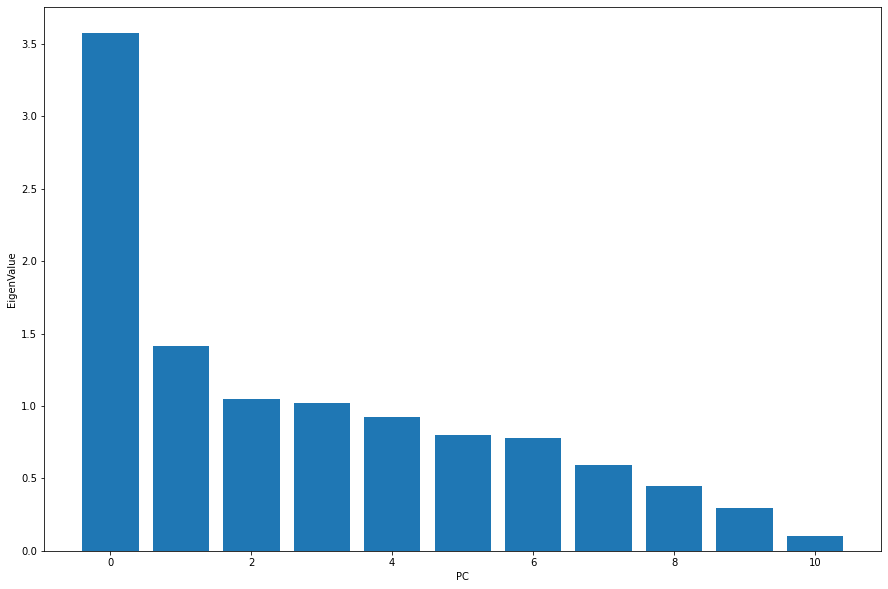

In [20]:
plt.bar(temp, eigens)
plt.xlabel("PC")
plt.ylabel('EigenValue')
eigens

loudness       -0.549517
duration_ms     0.491674
acousticness   -0.357958
dtype: float64

tempo         0.714128
popularity    0.402314
liveness     -0.341543
dtype: float64



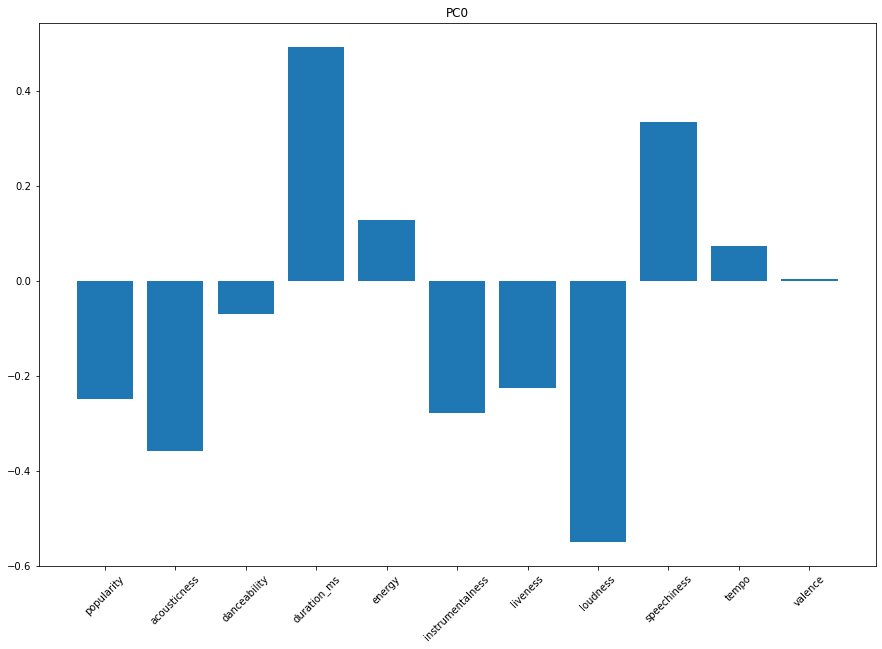

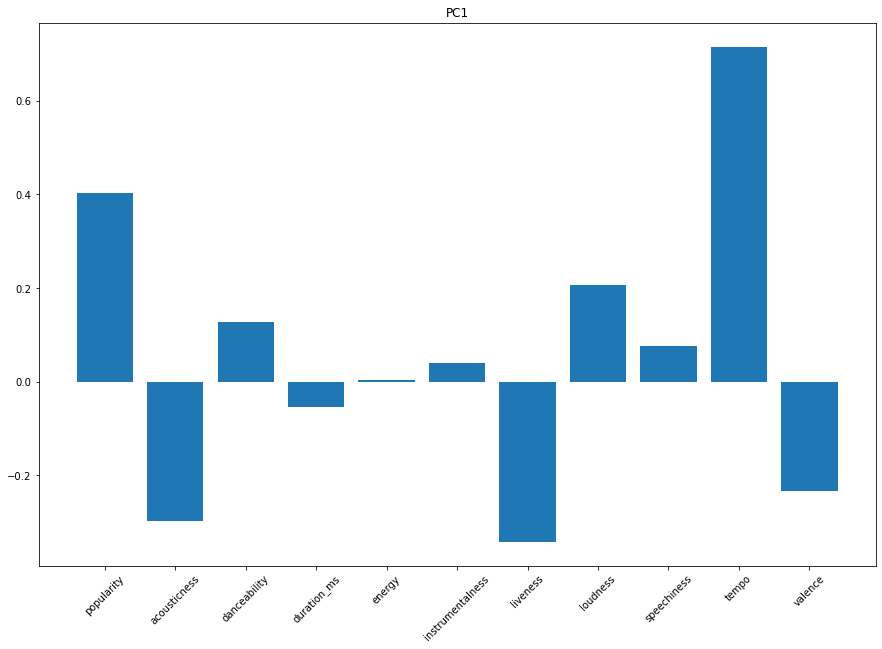

In [21]:
for ii in range(2):
    plt.figure()
    plt.bar(temp, loadings[:, ii])
    plt.xticks(temp, Xz.columns, rotation = 45)
    plt.title('PC%d' %ii)
    print(pd.Series(loadings[:, ii], index = Xz.columns).sort_values(ascending=False, key = abs)[:3])
    print()

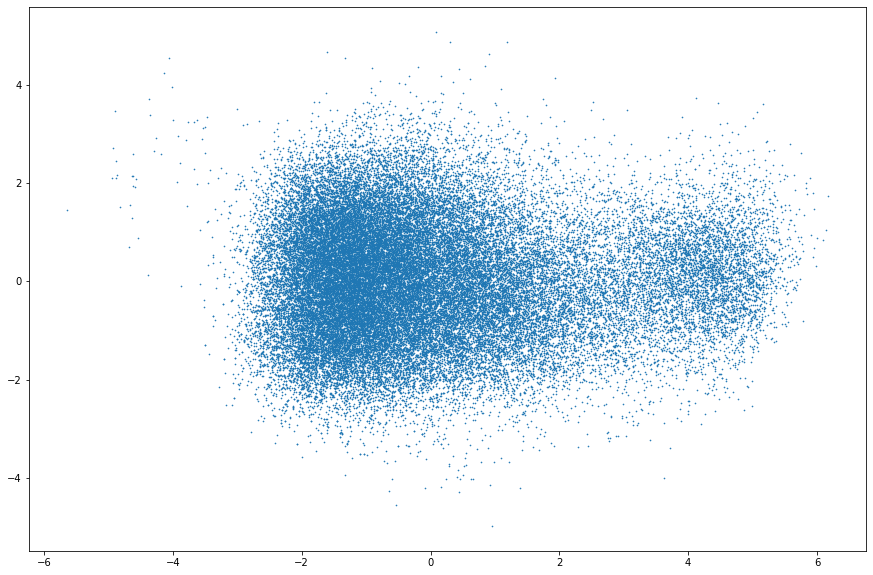

In [22]:
plt.scatter(musicPCA[:, 0], musicPCA[:, 1], s = 0.4)

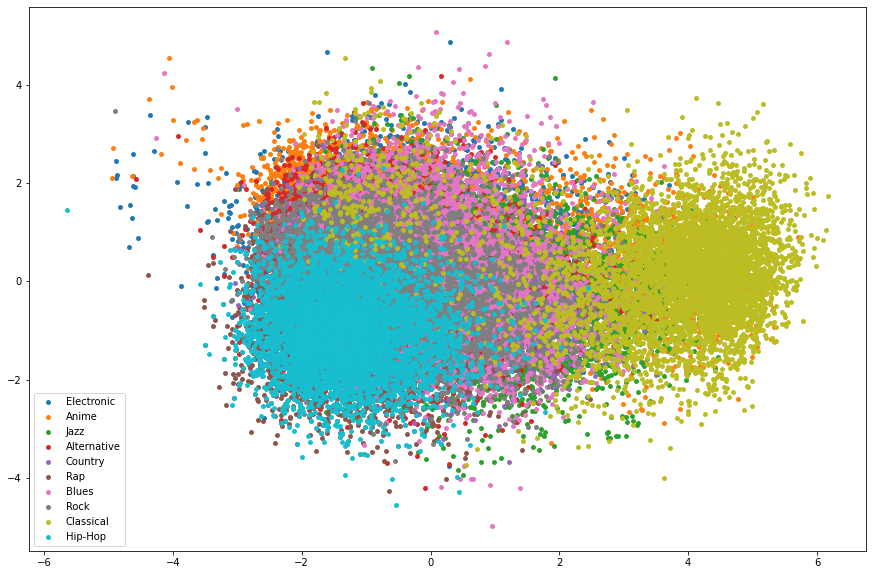

In [23]:
plt.figure(figsize=(15,10))
for ii in range(10):
    plt.scatter(musicPCA[np.argwhere(df.music_genre.values == ii), 0], musicPCA[np.argwhere(df.music_genre.values == ii), 1], s = 15, label = genres[ii])
plt.legend()

## KMeans

For n_clusters = 2 The average silhouette_score is : 0.2583741802960651
For n_clusters = 3 The average silhouette_score is : 0.1512215242531853
For n_clusters = 4 The average silhouette_score is : 0.1419998002640135


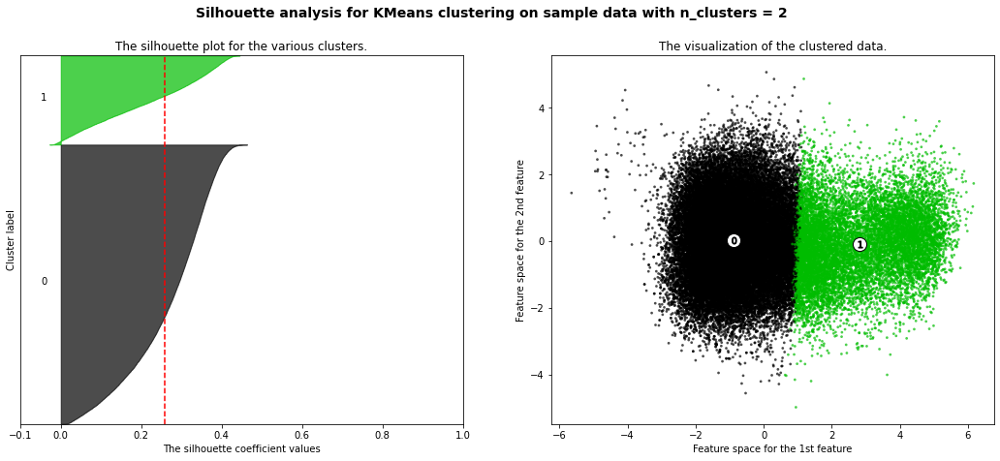

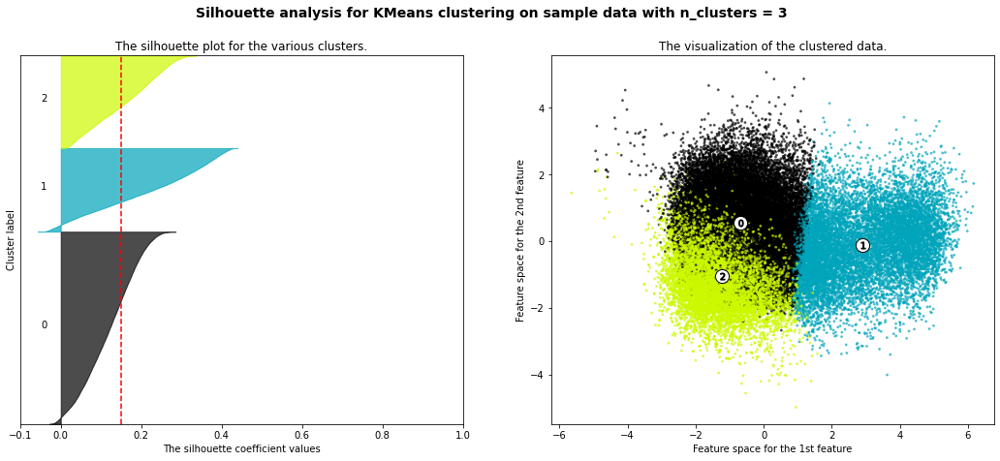

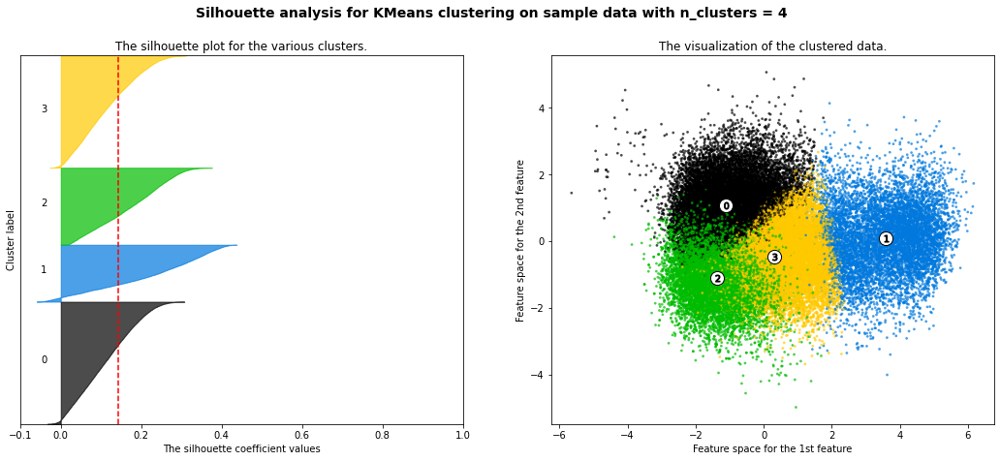

In [24]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm
def getSilh(X, range_n_clusters):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_jobs = -1)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

getSilh(musicPCA, [2,3,4])

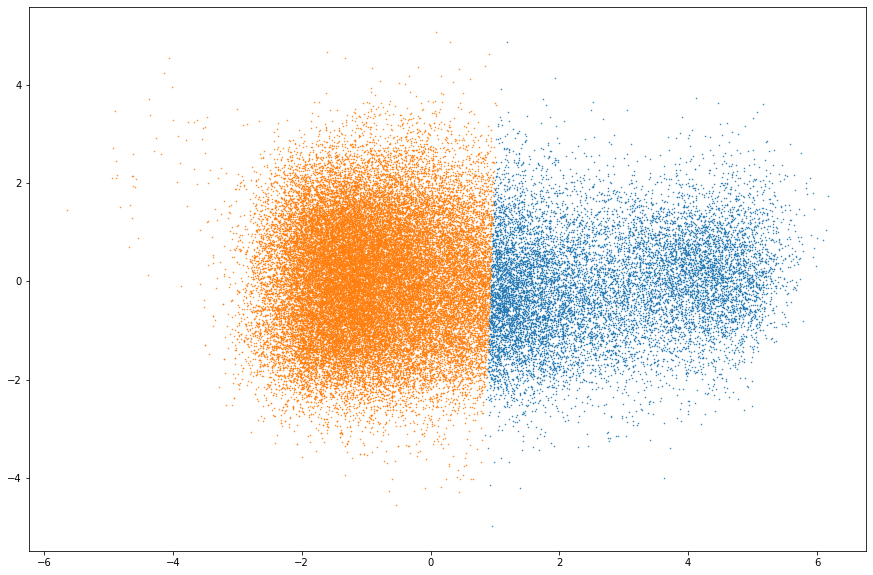

In [28]:
PC1 = musicPCA[:, 0]
PC2 = musicPCA[:, 1]

k = KMeans(2, init = 'random',n_jobs = -1, algorithm='elkan', max_iter= 3000).fit(musicPCA[:, :2])
k = k.predict(musicPCA[:, :2])

plt.plot(PC1[list(np.argwhere(k == 0))], PC2[list(np.argwhere(k == 0))], 'o', markersize = 0.5)
plt.plot(PC1[list(np.argwhere(k == 1))], PC2[list(np.argwhere(k == 1))], 'o',  markersize = 0.5)


# FAMD

In [29]:
temp = pd.read_csv('musicData.csv').drop_duplicates().drop(10000)
cats = temp[['key','mode']]
dfFAMD =X.select_dtypes(float).join(cats).reset_index().iloc[:, 1:]
dfFAMD.isna().sum()

popularity          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
key                 0
mode                0
dtype: int64

In [30]:
famd = prince.FAMD(n_components=2).fit(dfFAMD)
famdPC = famd.transform(dfFAMD)

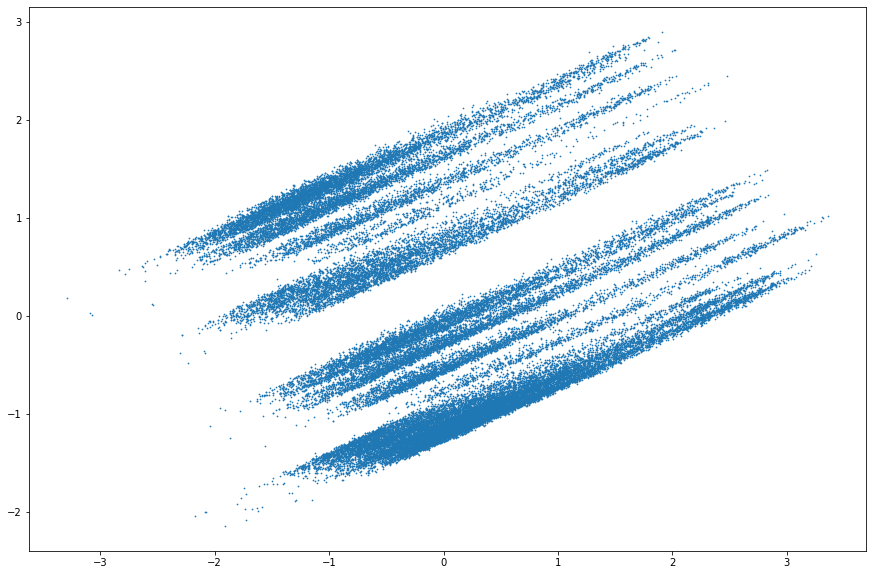

In [33]:
plt.scatter(famdPC.iloc[:, 0], famdPC.iloc[:, 1], s = 0.5)

In [69]:
famdPC

,0,1
0,-1.057497,1.319512
1,-0.295855,0.539423
2,-0.157457,-1.218487
3,-0.693322,-1.247108
4,-0.031128,-0.254296
...,...,...
49995,-0.748718,-1.241413
49996,-0.289726,-0.197271
49997,-0.334189,-1.345093
49998,-0.536162,0.539656


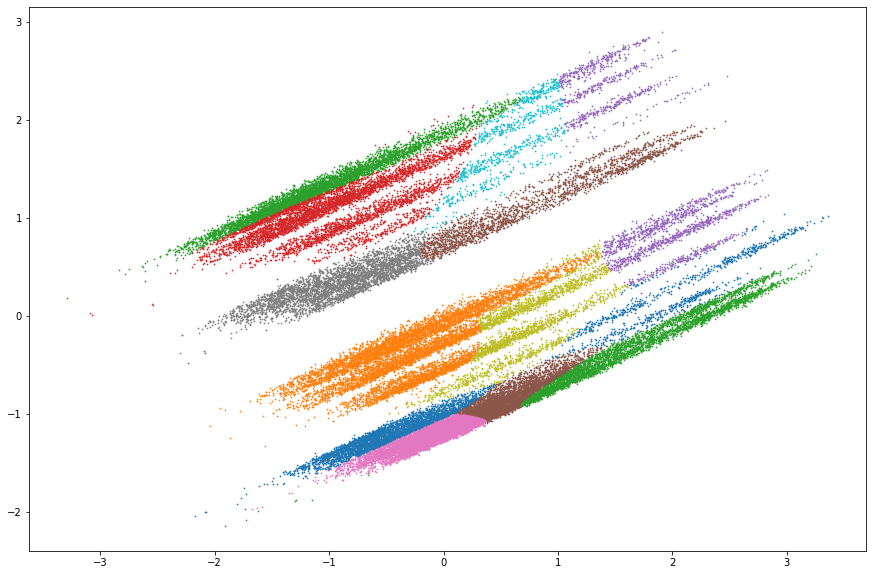

In [59]:
n = 16
gmm = GM(n_components=n, covariance_type = 'full').fit(famdPC)#.predict(musicPCA[:, :2])
#clusterProbsFAMD = pd.DataFrame(gmm.predict_proba(famdPC), columns = ['cluster0Prob','cluster1Prob'])
k = gmm.predict(famdPC)
for ii in range(n):
    plt.scatter(famdPC.iloc[list(np.argwhere(k == ii)[:,0]), 0], famdPC.iloc[list(np.argwhere(k == ii)[:,0]), 1], s = 0.5)


# GM

,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,isMajor,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,cluster0Prob,cluster1Prob
0,1,0,0,0,0,0,0,0,0,0,0,0,-1.108003,-1.136053,0.524878,0.194354,1.289876,1.772964,-0.417886,0.646260,0.185251,-0.645558,1.225073,0.000137,0.999863
1,0,0,0,0,1,0,0,0,0,0,0,0,-0.850633,-1.002093,0.356933,-0.136706,1.097101,1.930943,-0.304278,0.207151,-0.992433,-0.162673,0.302431,0.001749,0.998251
2,0,0,0,0,0,0,0,0,0,0,1,1,-1.043661,-1.175660,0.345737,-0.171868,0.586813,-0.132440,1.897215,0.806983,-0.812276,0.281855,-0.498812,0.000085,0.999915
3,0,0,0,1,0,0,0,0,0,0,0,1,-0.657606,-0.860887,1.207853,-0.901248,0.378918,-0.382111,0.051498,0.841374,1.682646,0.282540,-0.753752,0.000014,0.999986
4,0,0,0,0,0,0,0,0,1,0,0,1,-0.786291,-1.136717,0.446504,-0.084046,-0.048212,1.891744,0.051498,0.381731,-0.580375,0.864958,-0.539278,0.004097,0.995903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0,0,0,1,0,0,0,0,0,0,0,1,0.950954,-0.790153,1.985998,-0.176797,-0.097351,-0.754319,-0.366334,0.211696,1.967044,-0.743449,-0.510952,0.000009,0.999991
49996,0,1,0,0,0,0,0,0,0,0,0,1,1.787405,-0.144384,0.843973,0.270440,-0.898692,-0.754319,-0.498678,-0.327054,-0.211106,0.078239,-1.389081,0.002453,0.997547
49997,0,0,0,0,1,0,0,0,0,0,0,1,0.436214,-1.109265,0.754403,-0.539592,0.617052,-0.754319,-0.089328,0.583186,1.047339,0.387411,-0.247918,0.000005,0.999995
49998,0,0,0,0,0,0,0,0,0,1,0,0,1.337008,-0.470970,1.252639,0.391179,-0.482901,-0.754319,-0.540757,0.695810,-0.495818,-1.501050,-0.413831,0.000218,0.999782


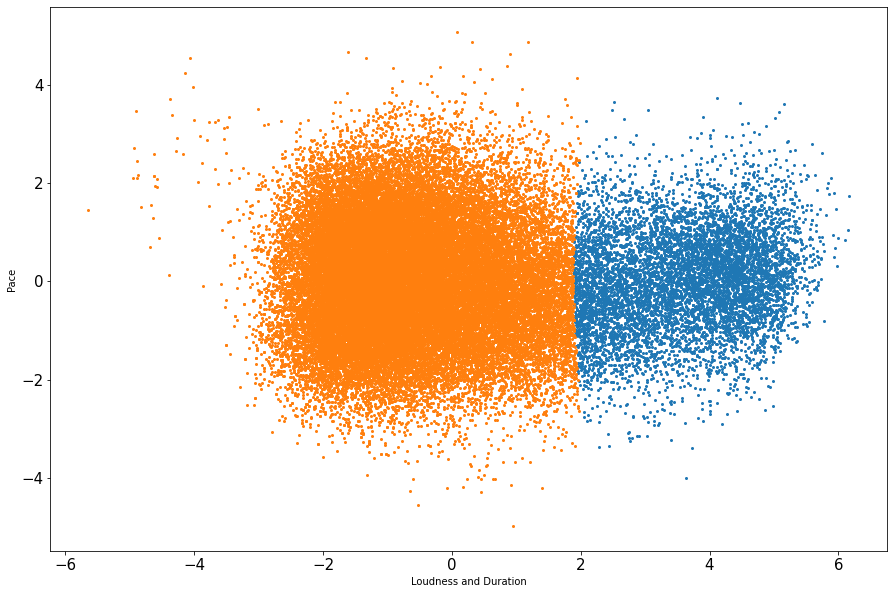

In [175]:

PCAandCat = pd.DataFrame(musicPCA[:, :2]).join(X.select_dtypes(['uint8',int]).reset_index())
gmm = GM(n_components=2, covariance_type = 'spherical').fit(musicPCA[:, :2])#.predict(musicPCA[:, :2])
clusterProbs = pd.DataFrame(gmm.predict_proba(musicPCA[:, :2]), columns = ['cluster0Prob','cluster1Prob'])
k = gmm.predict(musicPCA[:, :2])
plt.plot(PC1[list(np.argwhere(k == 0))], PC2[list(np.argwhere(k == 0))], 'o', markersize = 2)
plt.plot(PC1[list(np.argwhere(k == 1))], PC2[list(np.argwhere(k == 1))], 'o',  markersize = 2)
plt.xlabel('Loudness and Duration', fontsize = 10)
plt.ylabel('Pace', fontsize = 10)
plt.rc('font', size = 10)  
#pd.DataFrame(k.predict_proba(musicPCA[:, :2]), columns = ['Cluster0Prob', 'Cluster2Prob']).join
PCAGM = pd.DataFrame(musicPCA).join(clusterProbs).join(X.select_dtypes(['uint8',int]).reset_index()).drop('index', axis = 1).join(y.reset_index())
dfGM = scaledX.join(clusterProbs).iloc[:,1:]
dfGM


## 3D Cluster

In [92]:
import plotly.graph_objects as go
plot = go.Figure(layout = go.Layout(width = 1000, height = 800))
plot.add_trace(go.Scatter3d(x = musicPCA[:, 0], y = musicPCA[:, 1], z = musicPCA[:, 2], mode = 'markers',marker_size = 1))

In [93]:
def getPC(df, numCP):
    Xz = StandardScaler().fit_transform(df.drop('isMajor', axis = 1))
    temp = df.isMajor.values
    Xz = np.vstack([Xz.T, temp]).T
    pca = PCA(n_components=numCP).fit_transform(Xz)
    return pca
    

In [341]:
from sklearn.manifold import TSNE
#tsne = TSNE(perplexity=20, n_jobs = -1).fit(Xz)
musicTsne = TSNE(perplexity=30, n_jobs = -1).fit_transform(Xz)


KeyboardInterrupt: 

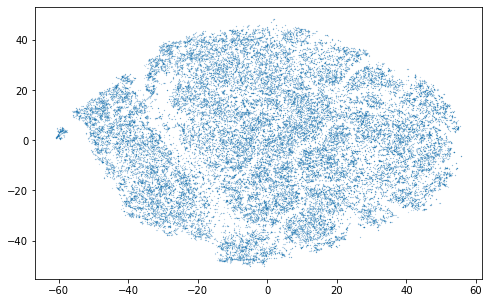

In [192]:
plt.scatter(musicTsne[:, 0], musicTsne[:, 1], s = 0.01)
#plt.title("perplexity= 20, KL-Divergence= %0.5f" % tsne.kl_divergence_)

# AUC function

In [227]:
from yellowbrick.classifier import ROCAUC
def plotROC(model, xtrain, ytrain, xtest, ytest):
    plt.figure(figsize = (15,10))
    # Creating visualization with the readable labels
    visualizer = ROCAUC(model)
                                        
    # Fitting to the training data first then scoring with the test data                                    
    visualizer.fit(xtrain, ytrain)
    visualizer.score(xtest, ytest)
    visualizer.show()
    
    return visualizer


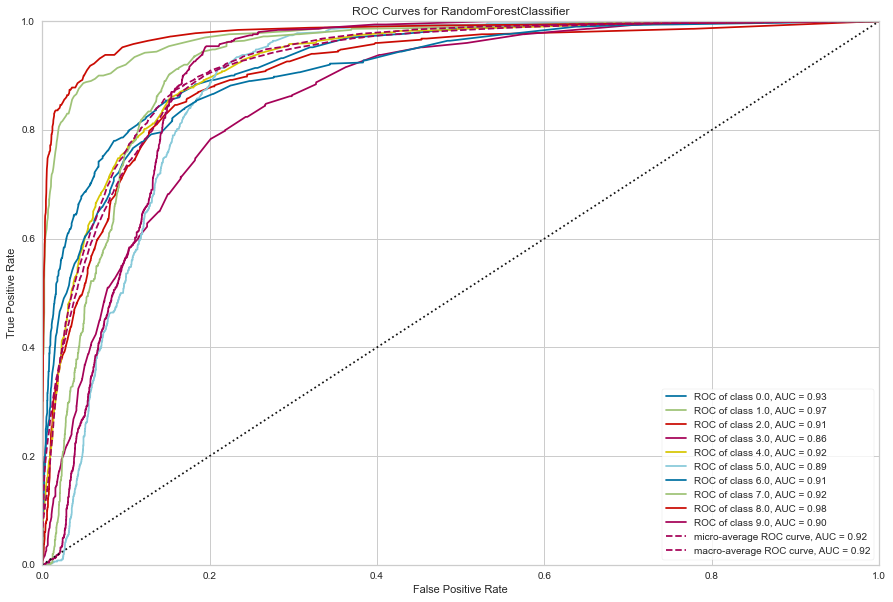

array(['Electronic', 'Anime', 'Jazz', 'Alternative', 'Country', 'Rap',
       'Blues', 'Rock', 'Classical', 'Hip-Hop'], dtype=object)

In [691]:
plotROC(RandomForestClassifier(n_jobs = -1), XTrain, yTrain, XTest, yTest)
genres

In [548]:
#plotROC(Perceptron(), XTrain, yTrain, XTest, yTest)
yTrain.value_counts()

4.0    4500
5.0    4500
0.0    4500
8.0    4500
3.0    4500
9.0    4500
6.0    4500
7.0    4500
1.0    4500
2.0    4500
Name: music_genre, dtype: int64

# Basic Model Performance

## Is data linearly separatable? Use perceptron to check

In [262]:
per = Perceptron()
per.fit(XTrain, yTrain)
per.score(XTrain, yTrain)
per.score(XTest, yTest)
# No! So linear models may not work



0.3327777777777778

## baseline performance

### functions

In [267]:
def getModelPerformance(model, XTrain, yTrain, XTest, yTest):
    model.fit(XTrain, yTrain)
    acc = model.score(XTest, yTest)
    auc = roc_auc_score(yTest, model.predict_proba(XTest), multi_class='ovr')
    return acc, auc
def createModels():
    rf = RandomForestClassifier(n_jobs=-1)
    logi = LogisticRegression(multi_class='ovr')
    #ada = AdaBoostClassifier(base_estimator=DecisionTreeClassifier())
    tree = DecisionTreeClassifier()
    #SVM = svm.SVC()
    modelDic = {'RandomForest': rf, 'LogisticRegression': logi,  'DecisionTree': tree}
    return modelDic

def testModels(modelDic, XTrain, yTrain, XTest, yTest):
    for ii in list(modelDic.keys()):
        acc, auc = getModelPerformance(modelDic[ii] , XTrain, yTrain, XTest, yTest)
        print('%s:\tACC: %f\tAUC: %f' % (ii, acc, auc))

### test

In [379]:
XTrain, XTest, yTrain, yTest = trainTestSplit(df)

,0,1,2,3,4,5,6,7,8,9,10,cluster0Prob,cluster1Prob,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,isMajor,index,music_genre
0,-0.833755,0.835986,-1.038507,-1.207491,-1.017161,1.513655,1.583018,-0.482026,0.424945,0.086630,-0.013803,0.999859,0.000141,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,-0.063542,1.184262,-1.085170,-1.234178,-0.540306,0.568308,1.294547,-1.218239,-0.199699,0.076622,-0.341259,0.998208,0.001792,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2,-0.943017,1.684752,0.896355,-0.599775,-0.965744,-0.420358,0.046199,-0.346809,-1.415671,-0.270414,0.145552,0.999911,0.000089,0,0,0,0,0,0,0,0,0,0,0,1,1,2,0
3,-1.499095,-0.328275,1.094054,0.043954,0.614183,0.681289,1.416188,0.531332,-1.101840,-0.036040,0.159949,0.999985,0.000015,0,0,0,0,1,0,0,0,0,0,0,0,1,3,0
4,0.200823,1.346967,-0.323940,-0.733369,0.453753,0.741444,0.932826,-1.385770,-0.945728,-0.066318,0.528804,0.995811,0.004189,0,0,0,0,0,0,0,0,0,1,0,0,1,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,-1.576369,-1.912764,0.397982,1.443621,0.069755,0.800651,1.030391,0.115443,-0.796317,-0.439217,0.103091,0.999990,0.000010,0,0,0,0,1,0,0,0,0,0,0,0,1,50000,9
49996,0.042280,-1.155844,-0.355886,1.828014,0.804532,-0.827878,-0.382661,-0.678334,-0.926671,-0.310784,0.114148,0.997487,0.002513,0,0,1,0,0,0,0,0,0,0,0,0,1,50001,9
49997,-1.827801,-0.325536,0.422733,0.377665,0.615906,0.042066,0.650718,0.100563,-0.377666,-0.400534,-0.038244,0.999995,0.000005,0,0,0,0,0,1,0,0,0,0,0,0,1,50002,9
49998,-0.676067,-1.326818,-1.118888,1.384202,-0.902449,-0.842092,0.312957,-0.252884,-0.768429,0.016304,0.564731,0.999774,0.000226,0,0,0,0,0,0,0,0,0,0,1,0,0,50003,9


In [365]:
rf = RandomForestClassifier(n_jobs = -1)
tree = DecisionTreeClassifier()
ada = AdaBoostClassifier(DecisionTreeClassifier())
models = [rf, tree, ada]#[rf, SVM, ada]
for model in models:
    model.fit(XTrain, yTrain)
    acc = model.score(XTest, yTest)
    proba = model.predict_proba(XTest)
    Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
    Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
    plotROC(model, XTrain, yTrain, XTest, yTest)
    print("ACC: %f\tMicro: %f\tMacro: %f" % (acc, Microauc, Macroauc))

# Model trained with PCs
Remark: made accuracy significantly lower

In [381]:
# comparison with baseline
comparisonDf = pd.DataFrame(index = ['Baseline','DS1','DS2','DS3'], columns = ['Accuracy', 'MicroAUC','MacroAUC'])


In [373]:
pcaDf = pd.DataFrame(musicPCA[:, :8]).join(X.select_dtypes(['uint8',int]).reset_index()).drop('index', axis = 1)
pcaDf['music_genre'] = y.values
XTrain, XTest, yTrain, yTest = trainTestSplit(pcaDf)

In [374]:
rf = RandomForestClassifier(n_jobs = -1)
tree = DecisionTreeClassifier()
ada = AdaBoostClassifier(DecisionTreeClassifier())
models = [rf, tree, ada]#[rf, SVM, ada]

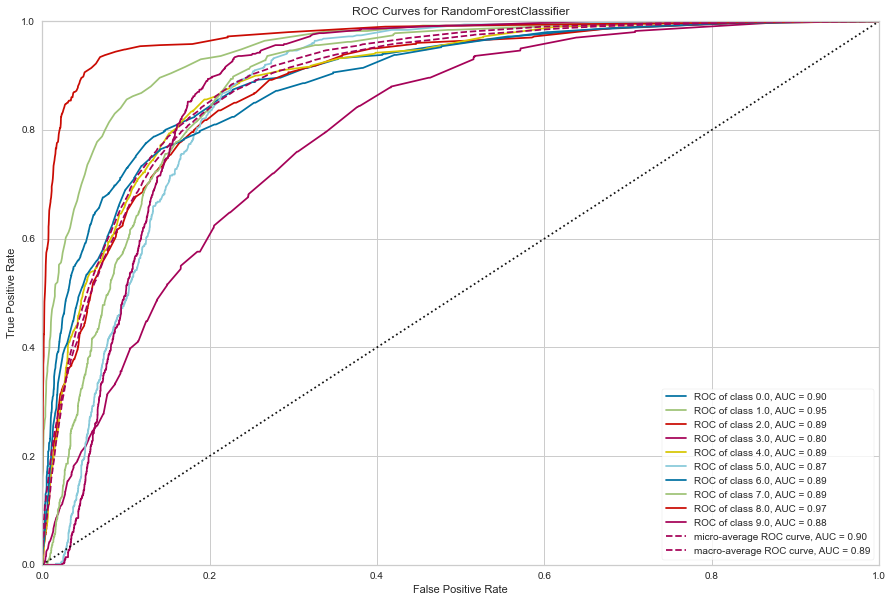

ACC: 0.487800	Micro: 0.893515	Macro: 0.893515


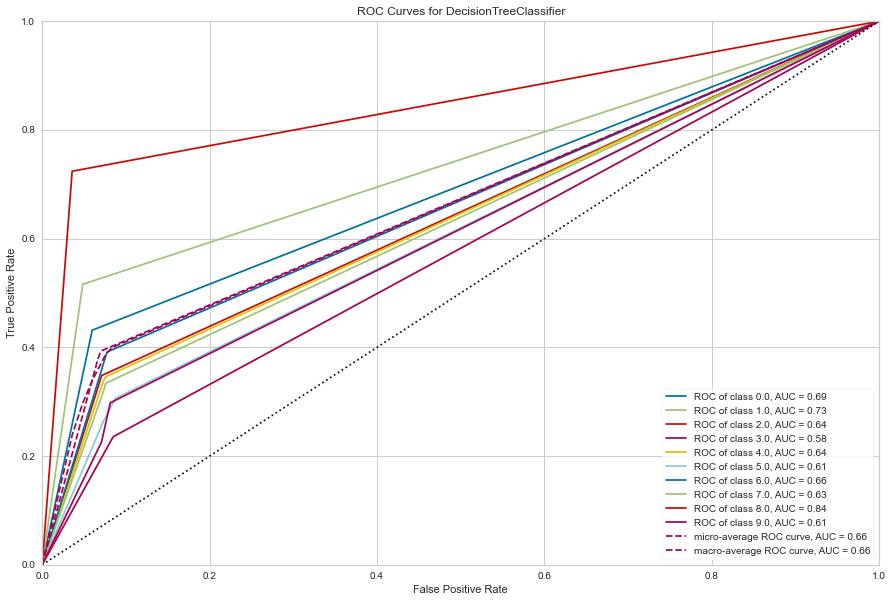

ACC: 0.383600	Micro: 0.661549	Macro: 0.661549


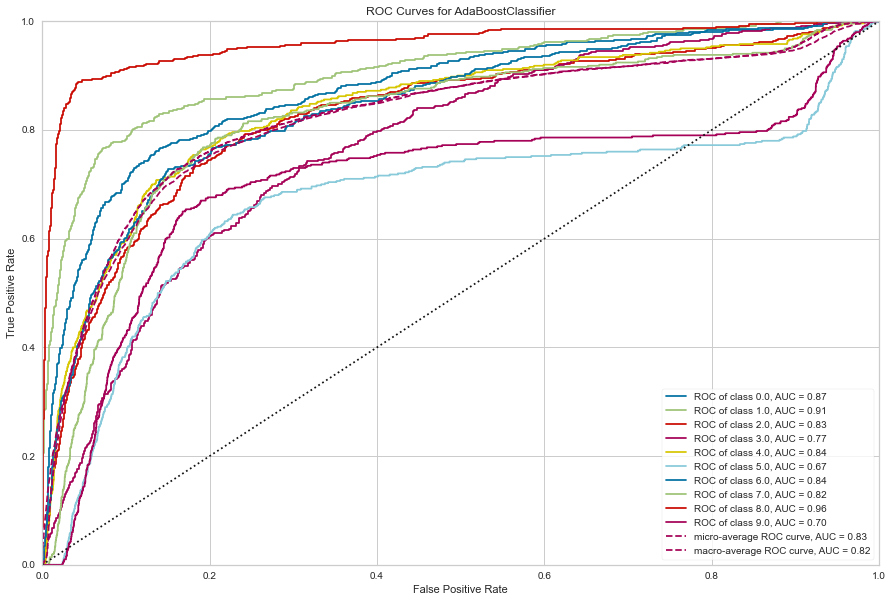

ACC: 0.473200	Micro: 0.821456	Macro: 0.821456


In [375]:
for model in models:
    model.fit(XTrain, yTrain)
    acc = model.score(XTest, yTest)
    proba = model.predict_proba(XTest)
    Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
    Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
    plotROC(model, XTrain, yTrain, XTest, yTest)
    print("ACC: %f\tMicro: %f\tMacro: %f" % (acc, Microauc, Macroauc))

In [241]:
testModels(createModels(), XTrain, yTrain, XTest, yTest)

RandomForest:	ACC: 0.515200	AUC: 0.898854
LogisticRegression:	ACC: 0.508400	AUC: 0.890544
DecisionTree:	ACC: 0.396600	AUC: 0.667003


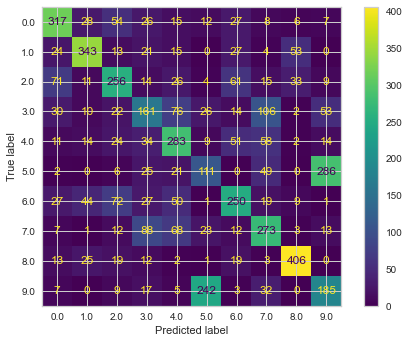

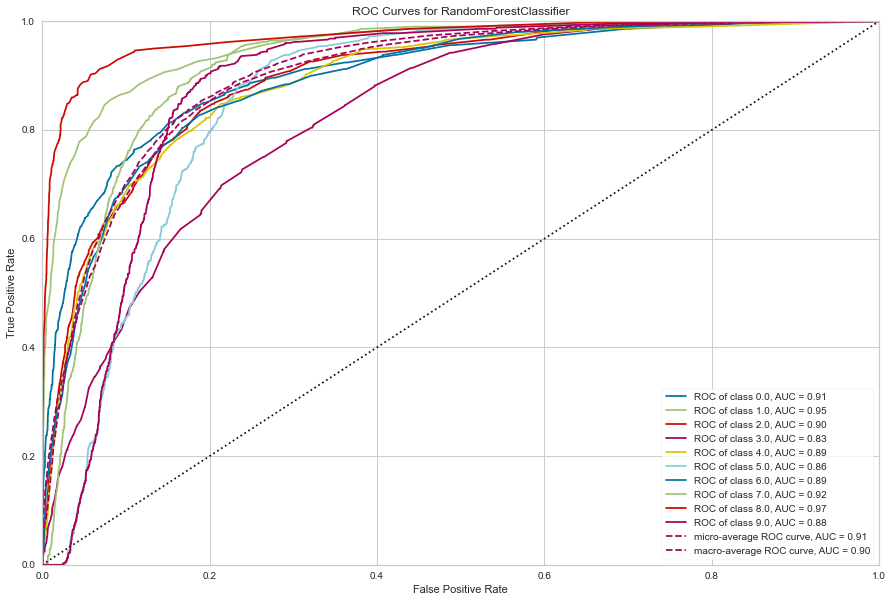

AttributeError: 'RandomForestClassifier' object has no attribute 'binary'

AttributeError: 'RandomForestClassifier' object has no attribute 'binary'

In [228]:
plot_confusion_matrix(rf, XTest, yTest)
plotROC(rf, XTrain, yTrain, XTest, yTest )

# Model with cluster labels

In [377]:
dfGM['music_genre'] = df.music_genre.values
XTrain, XTest, yTrain, yTest = trainTestSplit(dfGM)
dfGM

,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#,isMajor,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,cluster0Prob,cluster1Prob,music_genre
0,0,1,0,0,0,0,0,0,0,0,0,0,0,-1.108003,-1.136053,0.524878,0.194354,1.289876,1.772964,-0.417886,0.646260,0.185251,-0.645558,1.225073,0.999859,0.000141,0
1,0,0,0,0,0,1,0,0,0,0,0,0,0,-0.850633,-1.002093,0.356933,-0.136706,1.097101,1.930943,-0.304278,0.207151,-0.992433,-0.162673,0.302431,0.998208,0.001792,0
2,0,0,0,0,0,0,0,0,0,0,0,1,1,-1.043661,-1.175660,0.345737,-0.171868,0.586813,-0.132440,1.897215,0.806983,-0.812276,0.281855,-0.498812,0.999911,0.000089,0
3,0,0,0,0,1,0,0,0,0,0,0,0,1,-0.657606,-0.860887,1.207853,-0.901248,0.378918,-0.382111,0.051498,0.841374,1.682646,0.282540,-0.753752,0.999985,0.000015,0
4,0,0,0,0,0,0,0,0,0,1,0,0,1,-0.786291,-1.136717,0.446504,-0.084046,-0.048212,1.891744,0.051498,0.381731,-0.580375,0.864958,-0.539278,0.995811,0.004189,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0,0,0,0,1,0,0,0,0,0,0,0,1,0.950954,-0.790153,1.985998,-0.176797,-0.097351,-0.754319,-0.366334,0.211696,1.967044,-0.743449,-0.510952,0.999990,0.000010,9
49996,0,0,1,0,0,0,0,0,0,0,0,0,1,1.787405,-0.144384,0.843973,0.270440,-0.898692,-0.754319,-0.498678,-0.327054,-0.211106,0.078239,-1.389081,0.997487,0.002513,9
49997,0,0,0,0,0,1,0,0,0,0,0,0,1,0.436214,-1.109265,0.754403,-0.539592,0.617052,-0.754319,-0.089328,0.583186,1.047339,0.387411,-0.247918,0.999995,0.000005,9
49998,0,0,0,0,0,0,0,0,0,0,1,0,0,1.337008,-0.470970,1.252639,0.391179,-0.482901,-0.754319,-0.540757,0.695810,-0.495818,-1.501050,-0.413831,0.999774,0.000226,9


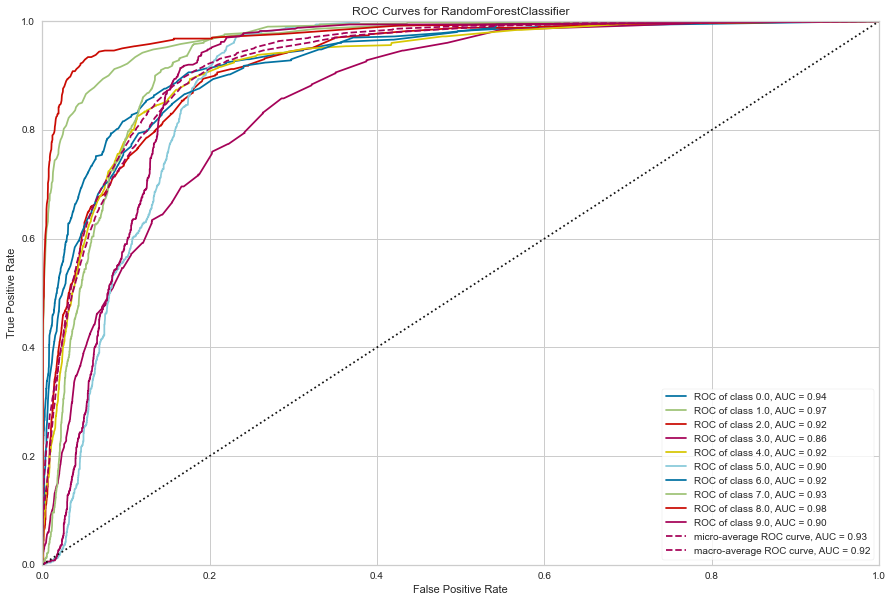

ACC: 0.575400	Micro: 0.924870	Macro: 0.924870


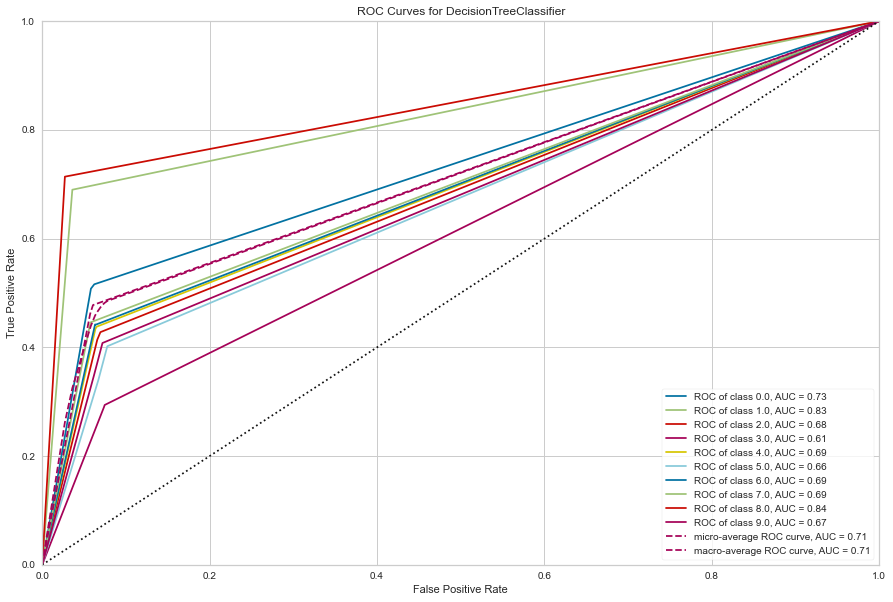

ACC: 0.468800	Micro: 0.708696	Macro: 0.708696


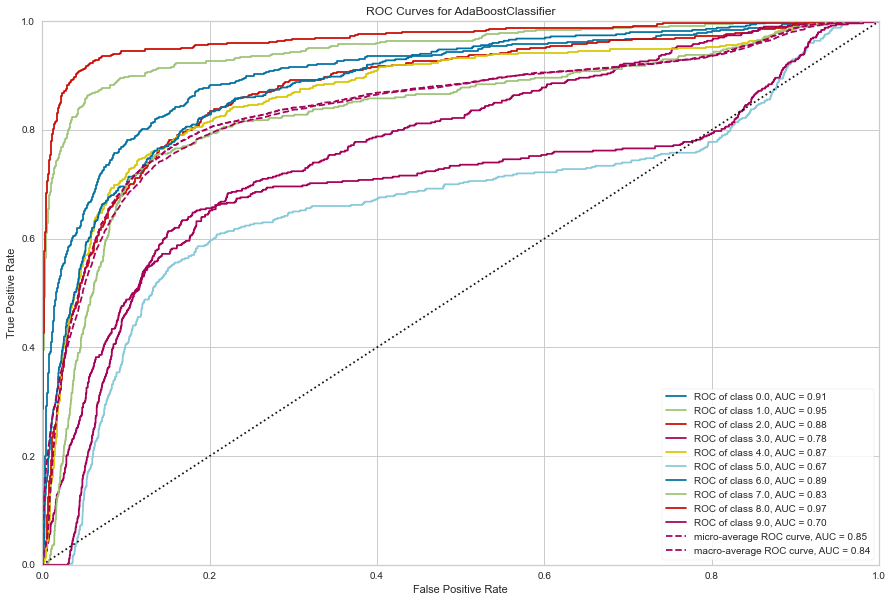

ACC: 0.541000	Micro: 0.844707	Macro: 0.844707


In [378]:
rf = RandomForestClassifier(n_jobs = -1)
tree = DecisionTreeClassifier()
ada = AdaBoostClassifier(DecisionTreeClassifier())
models = [rf, tree, ada]#[rf, SVM, ada]
for model in models:
    model.fit(XTrain, yTrain)
    acc = model.score(XTest, yTest)
    proba = model.predict_proba(XTest)
    Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
    Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
    plotROC(model, XTrain, yTrain, XTest, yTest)
    print("ACC: %f\tMicro: %f\tMacro: %f" % (acc, Microauc, Macroauc))

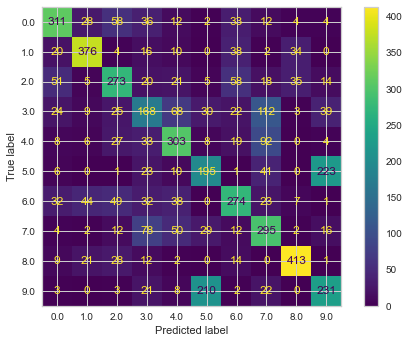

In [244]:
rf = RandomForestClassifier(n_jobs = -1).fit(XTrain, yTrain)
getModelPerformance()
plot_confusion_matrix(rf, XTest, yTest)

# Model with PCAGM

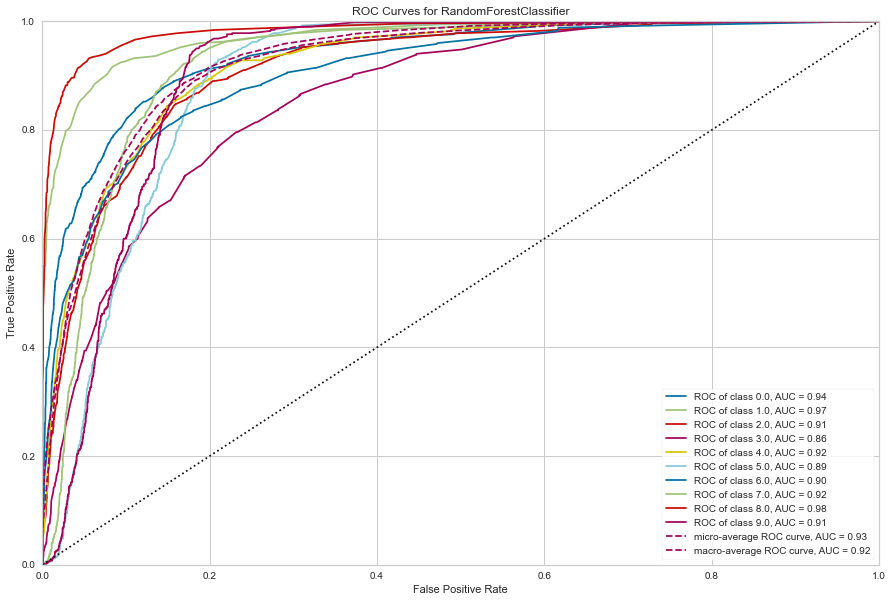

ACC: 0.564000	Micro: 0.920993	Macro: 0.920993


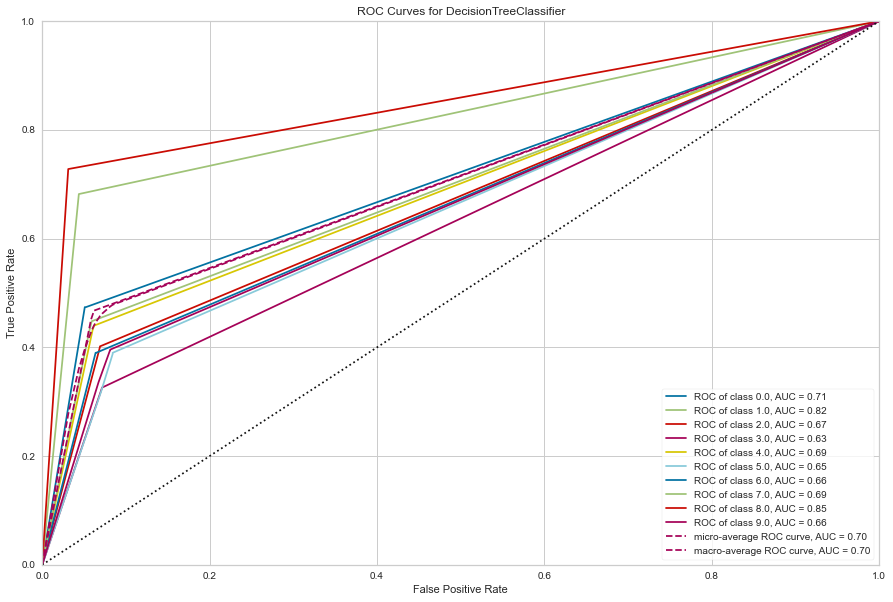

ACC: 0.459000	Micro: 0.702911	Macro: 0.702911


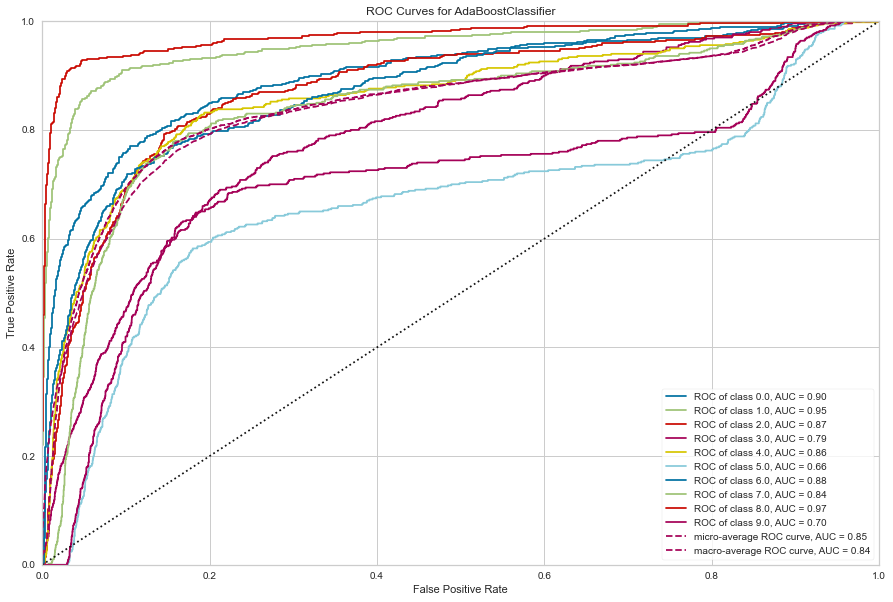

ACC: 0.535400	Micro: 0.843662	Macro: 0.843662


In [380]:
XTrain, XTest, yTrain, yTest = trainTestSplit(dfGM)
rf = RandomForestClassifier(n_jobs = -1)
tree = DecisionTreeClassifier()
ada = AdaBoostClassifier(DecisionTreeClassifier())
models = [rf, tree, ada]#[rf, SVM, ada]
for model in models:
    model.fit(XTrain, yTrain)
    acc = model.score(XTest, yTest)
    proba = model.predict_proba(XTest)
    Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
    Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
    plotROC(model, XTrain, yTrain, XTest, yTest)
    print("ACC: %f\tMicro: %f\tMacro: %f" % (acc, Microauc, Macroauc))

# Hyperparameter Tuning RF

In [475]:
XTrain, XTest, yTrain, yTest = trainTestSplit(dfGM)
# Baseline ACC: 0.575, AUC, 0.9249

In [476]:
model = RandomForestClassifier(n_estimators = 200, max_depth=16, max_features= 0.4,n_jobs = -1, min_samples_split = 14,  random_state=42)
model.fit(XTrain, yTrain)
proba = model.predict_proba(XTest)
Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
#plotROC(model, XTrain, yTrain, XTest, yTest)
print("ACC: %f\tMicro: %f\tMacro: %f" % (acc, Microauc, Macroauc))

ACC: 0.535400	Micro: 0.934586	Macro: 0.934586


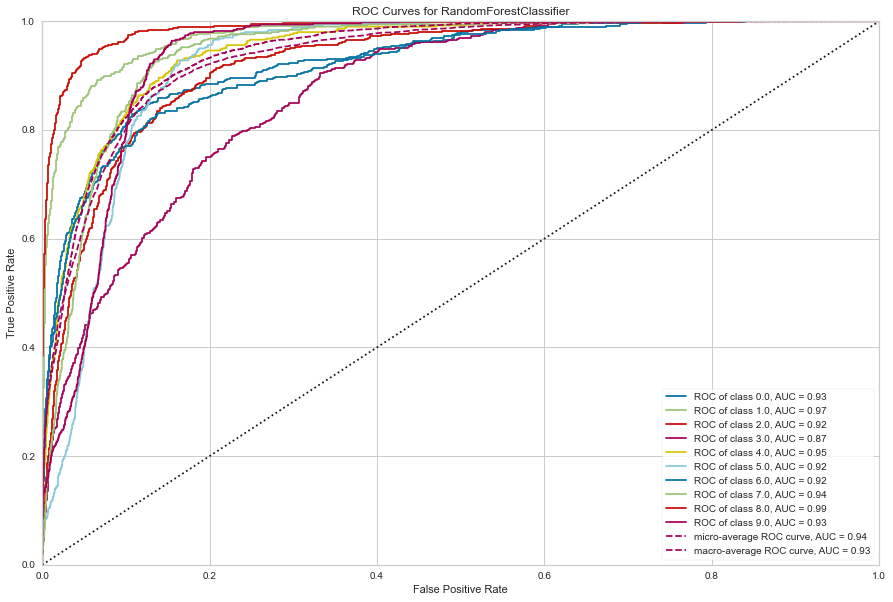

AttributeError: 'RandomForestClassifier' object has no attribute 'binary'

AttributeError: 'RandomForestClassifier' object has no attribute 'binary'

In [477]:
plotROC(model, XTrain, yTrain, XTest, yTest)

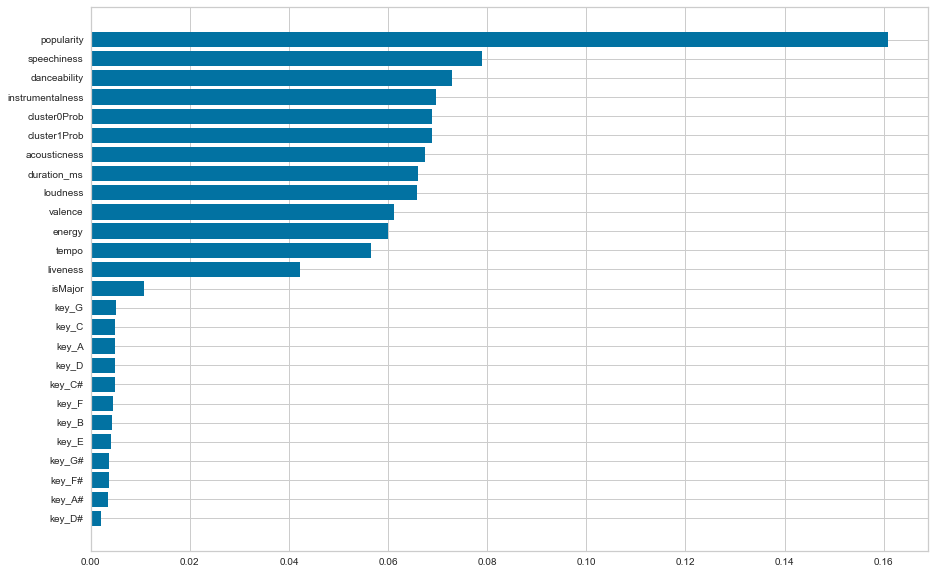

In [448]:
rf.feature_importances_
featureImportances = pd.Series(rf.feature_importances_, index = dfGM.columns[:-1]).sort_values()
plt.barh(list(range(len(featureImportances))), featureImportances)
plt.yticks(list(range(len(featureImportances))), featureImportances.index);

In [429]:
for ii in range(7, 16):
    model = RandomForestClassifier(max_depth=16, max_features= 0.4,n_jobs = -1, min_samples_split = ii, random_state=42)
    model.fit(XTrain, yTrain)
    proba = model.predict_proba(XTest)
    Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
    Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
    #plotROC(model, XTrain, yTrain, XTest, yTest)
    print("min_split: %d\tACC: %f\tMicro: %f\tMacro: %f" % (ii, acc, Microauc, Macroauc))
    

min_split: 7	ACC: 0.535400	Micro: 0.931509	Macro: 0.931509
min_split: 8	ACC: 0.535400	Micro: 0.932096	Macro: 0.932096
min_split: 9	ACC: 0.535400	Micro: 0.932628	Macro: 0.932628
min_split: 10	ACC: 0.535400	Micro: 0.931741	Macro: 0.931741
min_split: 11	ACC: 0.535400	Micro: 0.932251	Macro: 0.932251
min_split: 12	ACC: 0.535400	Micro: 0.932217	Macro: 0.932217
min_split: 13	ACC: 0.535400	Micro: 0.931786	Macro: 0.931786
min_split: 14	ACC: 0.535400	Micro: 0.932929	Macro: 0.932929
min_split: 15	ACC: 0.535400	Micro: 0.932246	Macro: 0.932246


In [432]:
for ii in [50,200,500,800, 1000]:
    model = RandomForestClassifier(n_estimators = ii, max_depth=16, max_features= 0.4,n_jobs = -1, min_samples_split = 14, random_state=42)
    model.fit(XTrain, yTrain)
    proba = model.predict_proba(XTest)
    Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
    Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
    #plotROC(model, XTrain, yTrain, XTest, yTest)
    print("n_estimators: %d\tACC: %f\tMicro: %f\tMacro: %f" % (ii, acc, Microauc, Macroauc))

n_estimators: 50	ACC: 0.535400	Micro: 0.931839	Macro: 0.931839
n_estimators: 200	ACC: 0.535400	Micro: 0.933399	Macro: 0.933399
n_estimators: 500	ACC: 0.535400	Micro: 0.933441	Macro: 0.933441
n_estimators: 800	ACC: 0.535400	Micro: 0.933475	Macro: 0.933475
n_estimators: 1000	ACC: 0.535400	Micro: 0.933555	Macro: 0.933555


In [452]:
XTrain, XTest, yTrain, yTest = trainTestSplit(dfGM.select_dtypes([float, int]).iloc[:, 1:])


In [473]:
model = RandomForestClassifier(n_estimators = 100, max_depth=14, max_features= 0.4,n_jobs = -1, min_samples_split = 14,  random_state=42)
model.fit(XTrain, yTrain)
proba = model.predict_proba(XTest)
Macroauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'macro')
Microauc = roc_auc_score(yTest, proba, multi_class='ovr', average = 'weighted')
#plotROC(model, XTrain, yTrain, XTest, yTest)
print("ACC: %f\tMicro: %f\tMacro: %f" % (acc, Microauc, Macroauc))

ACC: 0.535400	Micro: 0.930497	Macro: 0.930497


# Neural Network

In [95]:
import torch
from torch import nn
from IPython import display
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

In [115]:
class Data(Dataset):
    def __init__(self, d):
        self.x = d.type(torch.FloatTensor)[:, :-1]
        self.y = d.type(torch.long)[:, -1]
        self.numSample = d.shape[0]
    def __getitem__(self, index):
        return self.x[index], self.y[index]

    # we can call len(dataset) to return the size
    def __len__(self):
        return self.numSample
trainSet = Data(torch.tensor(trainDf.astype(float).values))
testSet = Data(torch.tensor(testDf.astype(float).values))
trainloader = DataLoader(dataset=trainSet,batch_size=128, shuffle=True)
testloader = DataLoader(dataset=testSet,batch_size=1024, shuffle=True)

In [152]:
def train(epoch, model, trainloader = trainloader):
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-3) 
    model.train()
    trainLoss = 0.0
    trainAuc = 0.0
    trainAcc = 0.0
    for _, (data, target) in enumerate(trainloader):
        optimizer.zero_grad()
        # forward pass through the model
        output = model(data)
        # forward pass through the cross-entropy loss function
        loss1 = nn.CrossEntropyLoss()
        loss = loss1(output, target)
        # backward pass through the cross-entropy loss function and the model
        trainLoss += loss.item()

        loss.backward()
        
        optimizer.step()

        predicted = output.argmax(dim = 1)

        trainAcc += torch.sum(predicted == target) / len(y)
        trainAuc += roc_auc_score(target, np.exp(output.detach().numpy()), multi_class='ovr', average = 'macro')
    '''print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(trainloader.dataset),
                100. * batch_idx / len(trainloader), loss.item()))'''
    print('Train Epoch: {} [Acc]: {:.6f}\t[Loss]: {:.6f}\t[Auc]: {:.6f}'.format(
                epoch, trainLoss / len(trainloader), trainAcc / len(trainloader), trainAuc / len(trainloader)))
    return trainLoss / len(trainloader), trainAcc / len(trainloader), trainAuc / len(trainloader)
            
def test(model, testloader = testloader):
    model.eval()
    tacc = 0.0
    tauc = 0.0
    valid_loss = 0.0
    with torch.no_grad():
        for data in testloader:
            X, y = data
            output = model(X)
            predicted = output.argmax(dim = 1)
            tauc += roc_auc_score(y, np.exp(output.detach().numpy()), multi_class='ovr', average = 'macro')
            tacc += torch.sum(predicted == y) / len(y)
            loss1 = nn.CrossEntropyLoss()
            loss = loss1(output, y)  
            
            # Calculate Loss
            valid_loss += loss.item()
    print('[Test Loss]: %f\t[Test Acc]: %f\t [Test AUC]: %f ' %  (valid_loss / len(testloader), tacc/len(testloader), tauc / len(testloader)))
    return valid_loss / len(testloader), tacc/len(testloader) , tauc / len(testloader)





In [189]:
H = 100
model = nn.Sequential(
    nn.Linear(24, H),
    nn.ReLU(),
    nn.Linear(H, H),
    nn.ReLU(),
    nn.Linear(H, H),
    nn.ReLU(),
    nn.Linear(H, H),
    nn.ReLU(),
    nn.Linear(H, 10),
    nn.LogSoftmax(dim=1)
)
class Relu(nn.Module):
    def __init__(self, inputSize, hiddenSize, numClasses):
        super().__init__()
        self.layers = nn.Sequential(
                nn.Linear(24, H),
                nn.ReLU(),
                nn.Linear(H, H),
                nn.ReLU(),
                nn.Linear(H, H),
                nn.ReLU(),
                nn.Linear(H, H),
                nn.ReLU(),
                nn.Linear(H, 10),
                nn.LogSoftmax(dim=1)
            )

    def forward(self, x):
        return self.layers(x)
model = Relu(24, H, 10)

In [159]:
numEpoch = 50
# first column is training, second is testing
loss = np.empty((numEpoch, 2)) * np.NaN
acc = np.empty((numEpoch, 2)) * np.NaN
auc = np.empty((numEpoch, 2)) * np.NaN
for ii in range(numEpoch):
    loss[ii, 0], acc[ii, 0], auc[ii, 0] = train(ii+1, model)
    loss[ii, 1], acc[ii, 1], auc[ii, 1] = test(model)

Train Epoch: 1 [Acc]: 1.738651	[Loss]: 0.311213	[Auc]: 0.809123
[Test Loss]: 1.601616	[Test Acc]: 0.366837	 [Test AUC]: 0.840590 
Train Epoch: 2 [Acc]: 1.555807	[Loss]: 0.387496	[Auc]: 0.852478
[Test Loss]: 1.487337	[Test Acc]: 0.419708	 [Test AUC]: 0.862765 
Train Epoch: 3 [Acc]: 1.441673	[Loss]: 0.439209	[Auc]: 0.875233
[Test Loss]: 1.389778	[Test Acc]: 0.477034	 [Test AUC]: 0.886773 
Train Epoch: 4 [Acc]: 1.345696	[Loss]: 0.478826	[Auc]: 0.893323
[Test Loss]: 1.333696	[Test Acc]: 0.494244	 [Test AUC]: 0.895329 
Train Epoch: 5 [Acc]: 1.313330	[Loss]: 0.492032	[Auc]: 0.899395
[Test Loss]: 1.291059	[Test Acc]: 0.502878	 [Test AUC]: 0.902464 
Train Epoch: 6 [Acc]: 1.297396	[Loss]: 0.496871	[Auc]: 0.901561
[Test Loss]: 1.301423	[Test Acc]: 0.501965	 [Test AUC]: 0.902031 
Train Epoch: 7 [Acc]: 1.277081	[Loss]: 0.504328	[Auc]: 0.903707
[Test Loss]: 1.258827	[Test Acc]: 0.523202	 [Test AUC]: 0.905807 
Train Epoch: 8 [Acc]: 1.270367	[Loss]: 0.505393	[Auc]: 0.905763
[Test Loss]: 1.275747	[Tes

In [177]:
def plotTrainTest(stat, statString):
    plt.figure()
    plt.plot(stat[:, 0], label = 'train')
    plt.plot(stat[:, 1], label = 'test')
    plt.legend()
    plt.title('Train %s vs. Test %s' % (statString, statString))
    plt.xlabel('numEpoch')
    plt.ylabel(statString)

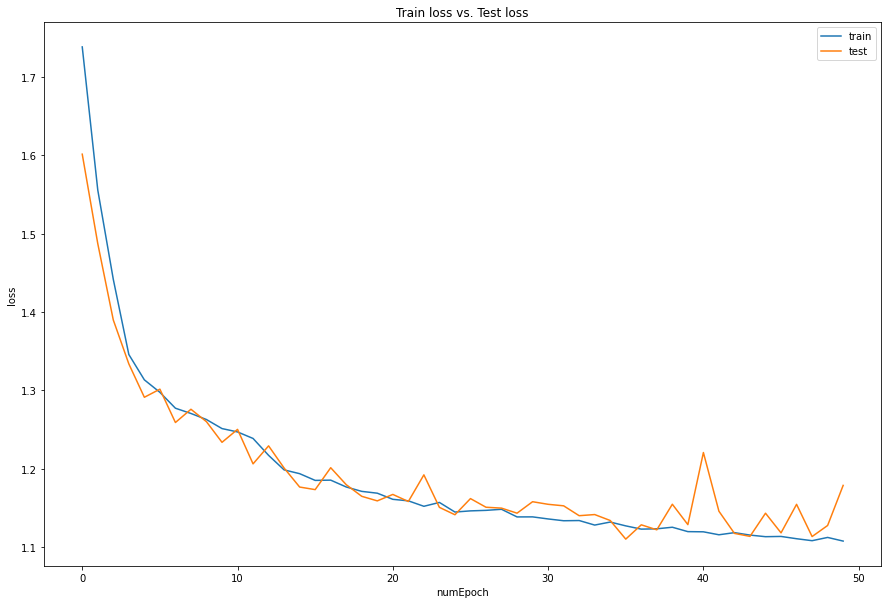

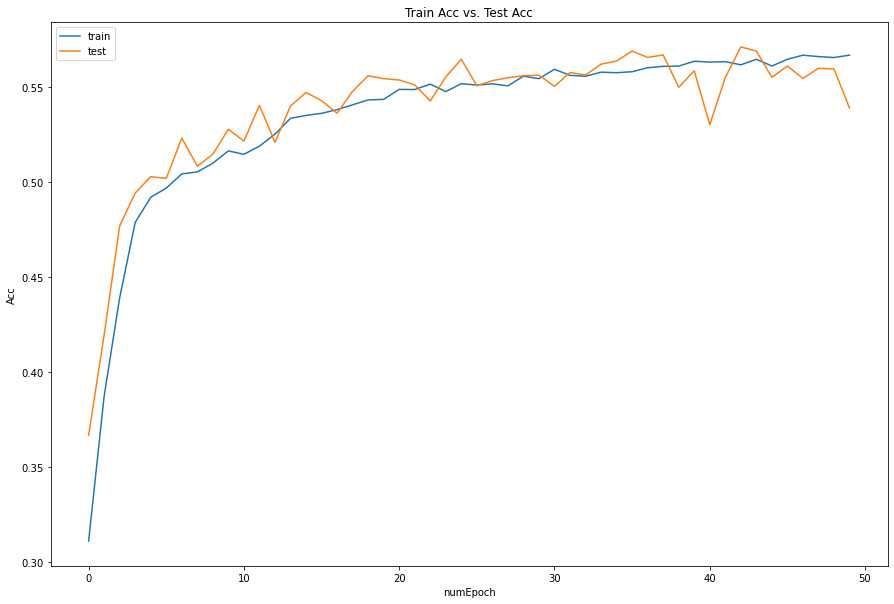

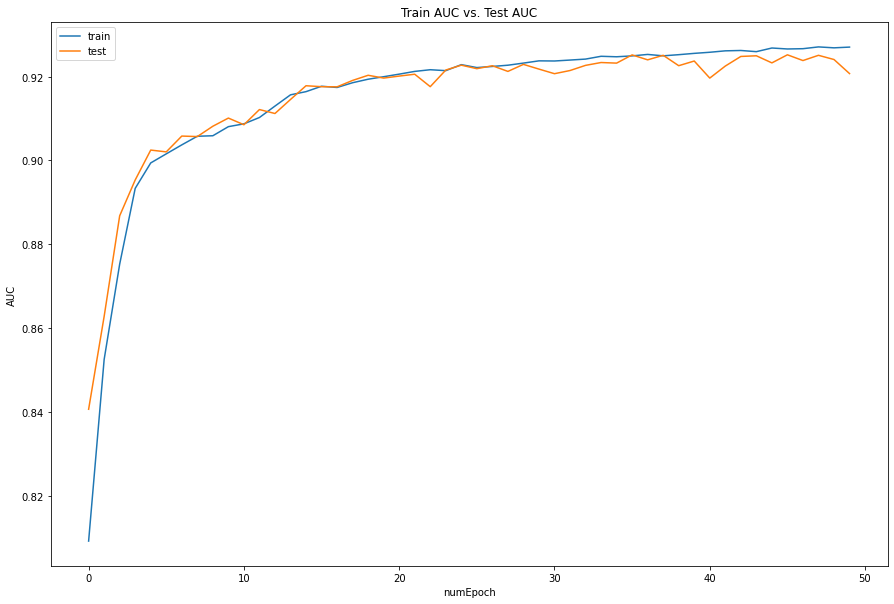

In [178]:
plotTrainTest(loss, 'loss')
plotTrainTest(acc, 'Acc')
plotTrainTest(auc, 'AUC')

In [183]:
l = np.argwhere(loss[:, 0] < loss[:, 1]).flatten()
ac = np.argwhere(acc[:, 0] < loss[:, 1]).flatten()
au = np.argwhere(auc[:, 0] < auc[:, 1]).flatten()
stopTraining = max(list(set(l).intersection(set(ac)).intersection(set(au))))

## Final NN Model

In [190]:
for ii in range(stopTraining):
    train(ii, model)
    test(model)

Train Epoch: 0 [Acc]: 1.763087	[Loss]: 0.000775	[Auc]: 0.801552
[Test Loss]: 1.587970	[Test Acc]: 0.388812	 [Test AUC]: 0.846268 
Train Epoch: 1 [Acc]: 1.531741	[Loss]: 0.001011	[Auc]: 0.857672
[Test Loss]: 1.485618	[Test Acc]: 0.418017	 [Test AUC]: 0.863924 
Train Epoch: 2 [Acc]: 1.469579	[Loss]: 0.001084	[Auc]: 0.869378
[Test Loss]: 1.411321	[Test Acc]: 0.457800	 [Test AUC]: 0.877724 
Train Epoch: 3 [Acc]: 1.400530	[Loss]: 0.001164	[Auc]: 0.882995
[Test Loss]: 1.340155	[Test Acc]: 0.498410	 [Test AUC]: 0.894550 
Train Epoch: 4 [Acc]: 1.332507	[Loss]: 0.001240	[Auc]: 0.896822
[Test Loss]: 1.334599	[Test Acc]: 0.498232	 [Test AUC]: 0.895693 
Train Epoch: 5 [Acc]: 1.293498	[Loss]: 0.001278	[Auc]: 0.902260
[Test Loss]: 1.326892	[Test Acc]: 0.492110	 [Test AUC]: 0.897942 
Train Epoch: 6 [Acc]: 1.275731	[Loss]: 0.001297	[Auc]: 0.904252
[Test Loss]: 1.255738	[Test Acc]: 0.523358	 [Test AUC]: 0.906870 
Train Epoch: 7 [Acc]: 1.270838	[Loss]: 0.001302	[Auc]: 0.905493
[Test Loss]: 1.237493	[Tes